In [1]:
%matplotlib notebook
import keras as keras
from keras.models import Sequential
from keras.layers import LSTM, Dense,BatchNormalization,Dropout,Flatten, Conv1D
from keras.losses import binary_crossentropy, categorical_crossentropy
from keras.metrics import categorical_accuracy
from keras import regularizers,optimizers
from keras.regularizers import l2
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
import gzip
from keras.layers.core import Lambda
from scipy.integrate import trapz
import seaborn as sns

from keras.layers.core import Lambda
from keras import backend as K    


def mini_batches(InputSample,BatchSize):
    Index = np.array(range(InputSample.shape[0]),dtype=int)
    NumBatches = np.int(InputSample.shape[0]/BatchSize)
    Removed = np.array([],dtype=int)

    BatchInd =[]
    for BatchLoop in range(NumBatches):
        RemainIndex = np.delete(Index,Removed)
        SampleInd = np.random.choice(RemainIndex,size=BatchSize,replace=False)
        Removed = np.append(Removed,SampleInd,axis=0)

        BatchInd.append(SampleInd)
    RemainIndex = np.delete(Index,Removed)
    BatchInd.append(RemainIndex)

    return BatchInd,NumBatches
    
def Get_Feats_and_Targets(filename):
    import numpy as np
    
    def line_to_Feats(line):
        line = line.split(' ')
        Feats = np.asarray(line[0:1024])
        Target = np.zeros([3])
        Target[int(line[1024])] = 1
        return Feats,Target

    f = open(filename, 'r')
    lines = f.readlines()
    Features = []
    Targets = []
    for i in range(len(lines)-1):
        line = lines[i+1]
        Feats,Tgts = line_to_Feats(line)
        Features.append(Feats)
        Targets.append(Tgts)
        
    return np.asarray(Features,dtype = 'float64'), np.asarray(Targets,dtype = 'int')

Using TensorFlow backend.


In [2]:
FullInputs = scipy.io.loadmat('MNIST_TrainInputs.mat')
FullInputs = FullInputs['images']

FullTargets = scipy.io.loadmat('MNIST_TrainTargets.mat')
FullTargets = FullTargets['targets']


In [3]:
Validation_Cutoff = 0.75

Validation_Cutoff = np.int(Validation_Cutoff*FullInputs.shape[0])

ValInputs = FullInputs[Validation_Cutoff:,:]
ValTargets = FullTargets[Validation_Cutoff:,:]

TrainInputs = FullInputs[0:Validation_Cutoff,:]
TrainTargets = FullTargets[0:Validation_Cutoff,:]

In [4]:
data_dim = TrainInputs.shape[-1]
NumSamples = TrainInputs.shape[0]
Num_Targets = TrainTargets.shape[-1]

index = np.linspace(0,NumSamples,NumSamples,endpoint=False,dtype=int)

reg_coeff = 0.001

def Gen_Model(reg_coeff):
    model = Sequential()
    model.add(Dense(100,activation='relu',input_shape =(data_dim,),kernel_regularizer=l2(reg_coeff)))
    model.add(Dropout(0.25))
    model.add(Dense(100,activation='relu',input_shape =(data_dim,),kernel_regularizer=l2(reg_coeff)))
    model.add(Dropout(0.25))
    model.add(Dense(100,activation='relu',input_shape =(data_dim,),kernel_regularizer=l2(reg_coeff)))
    model.add(Dropout(0.25))
    model.add(Dense(Num_Targets,activation = 'softmax',kernel_regularizer=l2(reg_coeff),input_shape =(data_dim,)))
    optim = optimizers.adam(lr=0.00001)
    model.compile(loss='categorical_crossentropy',optimizer=optim,metrics=['categorical_accuracy'])
    return model
    
D2THard_model = Gen_Model(reg_coeff)
D2TEasy_model = Gen_Model(reg_coeff)
# EntHard_model = Gen_Model(reg_coeff)
EntEasy_model = Gen_Model(reg_coeff)

Uni_model = Gen_Model(reg_coeff)

D2THard_model.set_weights(Uni_model.get_weights())
D2TEasy_model.set_weights(Uni_model.get_weights())
# EntHard_model.set_weights(Uni_model.get_weights())
EntEasy_model.set_weights(Uni_model.get_weights())

In [5]:
def acquisition_function_BALD(model,samples,Num_Targets,temperature=1,Target_Ratio = 5):
    nb_MC_samples = 30
    MC_output = K.function([model.layers[0].input, K.learning_phase()], [model.layers[-1].output])
    MC_samples = np.zeros([nb_MC_samples,samples.shape[0],Num_Targets])
    learning_phase = True 
    for i in range(nb_MC_samples):
        MC_samples[i,:,:] = np.array([MC_output([samples, learning_phase])[0]])
        
    expected_entropy = - np.mean(np.sum(MC_samples * np.log(MC_samples + 1e-10), axis=-1), axis=0)  # [batch size]
    expected_p = np.mean(MC_samples, axis=0)
    entropy_expected_p = - np.sum(expected_p * np.log(expected_p + 1e-10), axis=-1)  # [batch size]
    BALD_acq = entropy_expected_p - expected_entropy
    
    Exp_BALD = np.exp(BALD_acq/temperature)
    Sampling_Prob = Exp_BALD/np.sum(Exp_BALD).astype(float)
    
    Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
    Target_Ratio = Target_Ratio
    if Max_Prob_Ratio < Target_Ratio:
        while Max_Prob_Ratio <Target_Ratio:
            temperature = temperature*0.99
            Exp_BALD = np.exp(BALD_acq/temperature)
            StoreSampling_Prob = Sampling_Prob.copy()
            Sampling_Prob = Exp_BALD/np.sum(Exp_BALD).astype(float)
            Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
            if np.isnan(Max_Prob_Ratio):
                Sampling_Prob = StoreSampling_Prob.copy()
    else:
        while Max_Prob_Ratio > Target_Ratio:
            temperature = temperature*1.01
            Exp_BALD = np.exp(BALD_acq/temperature)
            StoreSampling_Prob = Sampling_Prob.copy()
            Sampling_Prob = Exp_BALD/np.sum(Exp_BALD).astype(float)
            Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
            if np.isnan(Max_Prob_Ratio):
                Sampling_Prob = StoreSampling_Prob.copy()
    return Sampling_Prob

def acquisition_function_BALD_const_temp(model,samples,Num_Targets,temperature=1):
    nb_MC_samples =30
    MC_output = K.function([model.layers[0].input, K.learning_phase()], [model.layers[-1].output])
    MC_samples = np.zeros([nb_MC_samples,samples.shape[0],Num_Targets])
    learning_phase = True 
    for i in range(nb_MC_samples):
        MC_samples[i,:,:] = np.array([MC_output([samples, learning_phase])[0]])
        
    expected_entropy = - np.mean(np.sum(MC_samples * np.log(MC_samples + 1e-10), axis=-1), axis=0)  # [batch size]
    expected_p = np.mean(MC_samples, axis=0)
    entropy_expected_p = - np.sum(expected_p * np.log(expected_p + 1e-10), axis=-1)  # [batch size]
    BALD_acq = entropy_expected_p - expected_entropy
    
    Exp_BALD = np.exp(BALD_acq/temperature)
    Sampling_Prob = Exp_BALD/np.sum(Exp_BALD).astype(float)
    return Sampling_Prob
    
    

In [6]:
def average_dist_to_threshold(model,samples,Num_Targets):
    Output = model.predict(samples)
    Output -= 1/float(Num_Targets)
    Dist_to_Threshold = np.mean(np.abs(Output),1)
    return Dist_to_Threshold

def acquisition_function_dist_to_threshold(model,samples,Num_Targets,temperature=1,Target_Ratio=5):
    Output = model.predict(samples)
    Output -= 1/float(Num_Targets)
    Dist_to_Threshold = np.sum(np.abs(Output),1)
    Exp_Dist_to_Threshold = np.exp(Dist_to_Threshold/temperature)
    Exp_Dist_to_Threshold *= 1
#     Exp_Dist_to_Threshold = Dist_to_Threshold
    Sampling_Prob = Exp_Dist_to_Threshold/np.sum(Exp_Dist_to_Threshold).astype(float)
    Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
    Target_Ratio = Target_Ratio
    if Max_Prob_Ratio < Target_Ratio:
        while Max_Prob_Ratio <Target_Ratio:
            temperature = temperature*0.99
            Exp_Dist_to_Threshold = np.exp(Dist_to_Threshold/temperature)
            StoreSampling_Prob = Sampling_Prob.copy()
            Sampling_Prob = Exp_Dist_to_Threshold/np.sum(Exp_Dist_to_Threshold).astype(float)
            Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
            if np.isnan(Max_Prob_Ratio):
                Sampling_Prob = StoreSampling_Prob.copy()
    else:
        while Max_Prob_Ratio > Target_Ratio:
            temperature = temperature*1.01
            Exp_Dist_to_Threshold = np.exp(Dist_to_Threshold/temperature)
            StoreSampling_Prob = Sampling_Prob.copy()
            Sampling_Prob = Exp_Dist_to_Threshold/np.sum(Exp_Dist_to_Threshold).astype(float)
            Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
            if np.isnan(Max_Prob_Ratio):
                Sampling_Prob = StoreSampling_Prob.copy()
    return Sampling_Prob

def acquisition_function_dist_to_threshold_const_temp(model,samples,Num_Targets,temperature=1):
    Output = model.predict(samples)
    Output -= 1/float(Num_Targets)
    Dist_to_Threshold = np.sum(np.abs(Output),1)
    Exp_Dist_to_Threshold = np.exp(Dist_to_Threshold/temperature)
    Sampling_Prob = Exp_Dist_to_Threshold/np.sum(Exp_Dist_to_Threshold).astype(float)
    return Sampling_Prob

def acquisition_function_dist_to_threshold_determ(model,samples,Num_Targets,temperature=1):
    Output = model.predict(samples)
    Output -= 1/float(Num_Targets)
    Dist_to_Threshold = np.sum(np.abs(Output),1)
    Exp_Dist_to_Threshold = np.exp(Dist_to_Threshold/temperature)
    Sampling_Prob = Exp_Dist_to_Threshold/np.sum(Exp_Dist_to_Threshold).astype(float)
    Argmax= Sampling_Prob.argmax()
    Sampling_Prob_Determ = np.zeros_like(Sampling_Prob)
    Sampling_Prob_Determ[Argmax] = 1 
    return Sampling_Prob

def acquisition_function_entropy(model,samples,Num_Targets,temperature=1,Target_Ratio=5):
    Output = model.predict(samples)
    Entropy = -np.sum(Output * np.log(Output),1)
    Exp_Entropy = np.exp(Entropy/temperature)
    Sampling_Prob = Exp_Entropy/np.sum(Exp_Entropy).astype(float)
    Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
    Target_Ratio = Target_Ratio
    if Max_Prob_Ratio < Target_Ratio:
        while Max_Prob_Ratio <Target_Ratio:
            temperature = temperature*0.99
            Exp_Entropy = np.exp(Entropy/temperature)
            StoreSampling_Prob = Sampling_Prob.copy()
            Sampling_Prob = Exp_Entropy/np.sum(Exp_Entropy).astype(float)
            Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
            if np.isnan(Max_Prob_Ratio):
                Sampling_Prob = StoreSampling_Prob.copy()
    else:
        while Max_Prob_Ratio > Target_Ratio:
            temperature = temperature*1.01
            Exp_Entropy = np.exp(Entropy/temperature)
            StoreSampling_Prob = Sampling_Prob.copy()
            Sampling_Prob = Exp_Entropy/np.sum(Exp_Entropy).astype(float)
            Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
            if np.isnan(Max_Prob_Ratio):
                Sampling_Prob = StoreSampling_Prob.copy()
    return Sampling_Prob

def Exp_ModelChange(Model,Inputs,Num_Targets):
    ExpChange = np.zeros(Inputs.shape[0])
    Model_Output = Model.predict(Inputs)
    for TargetLoop in range(Num_Targets):
        thisTarget = np.zeros([Inputs.shape[0],Num_Targets])
        thisTarget[:,TargetLoop] = 1
        ClassProb = Model_Output[:,TargetLoop]
        Loss = np.mean(Model_Output - Model_Output*thisTarget + np.log(1+np.exp(-Model_Output)),1)
        ExpChange += Loss*ClassProb
    return ExpChange

def acquisition_function_exp_model_change(model,samples,Num_Targets,temperature = 1,Target_Ratio = 5):
    ExpectedChange = Exp_ModelChange(model,samples,Num_Targets)
    ExpChange = np.exp(ExpectedChange/temperature)
    Sampling_Prob = ExpChange/np.sum(ExpChange).astype(float)
    Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
    if Max_Prob_Ratio < Target_Ratio:
        while Max_Prob_Ratio <Target_Ratio:
            temperature = temperature*0.99
            ExpChange = np.exp(ExpectedChange/temperature)
            Sampling_Prob = ExpChange/np.sum(ExpChange).astype(float)
            Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
    else:
        while Max_Prob_Ratio > Target_Ratio:
            temperature = temperature*1.01
            ExpChange = np.exp(ExpectedChange/temperature)
            Sampling_Prob = ExpChange/np.sum(ExpChange).astype(float)
            Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
    return Sampling_Prob

    


In [7]:
def ablate_network(model,ablation_perc):
    weights = model.get_weights()
    save_weights = list(weights)
    NumLayers = len(weights)
    total_numweights  = 0 
    for i in range(NumLayers):
        layer = weights[i]
        total_numweights += len(layer.flatten())
    num_ablations = np.int(ablation_perc*total_numweights)
    weights = ablate_weights(weights,num_ablations)
    model.set_weights(weights)
        
    return(model,save_weights)


def ablation_curve(model,num_tests,max_perc,inputs,targets):
    Perc_Space = np.linspace(0,max_perc,num_tests)
    Performance = np.zeros(num_tests)
    for i in range(num_tests):
        model,save_weights = ablate_network(model,Perc_Space[i])
        Perf = model.test_on_batch(inputs,targets)
        Performance[i] = Perf[1]
        model.set_weights(save_weights)
        AUC = trapz(Performance,Perc_Space)
        
    return AUC,Performance
    
    
def ablate_weights(weights,num_ablations):
    NumLayers = len(weights)
    LayerShape = []
    LayerShape = []
    LayerNodes = [0]
    FlattenedNodes = np.empty([0])
    for i in range(NumLayers):
        LayerShape.append(weights[i].shape)
        LayerNodes.append(len(weights[i].flatten()))
        FlattenedNodes = np.append(FlattenedNodes,weights[i].flatten())
        Index = np.linspace(0,len(FlattenedNodes)-1,num=len(FlattenedNodes),dtype = int)
    RandChoice = np.random.choice(Index,size = num_ablations,replace=False)
    FlattenedNodes[RandChoice] = 0
    FirstInd = 0
    for i in range(NumLayers):
        FirstInd += LayerNodes[i]
        SecondInd = FirstInd + LayerNodes[i+1]
        Sample = FlattenedNodes[FirstInd:SecondInd]
        Sample = Sample.reshape(LayerShape[i])
        weights[i] = Sample
        
    return weights


def acquisition_function_ablation(model,Inputs,Targets,Cluster_Size,temperature=1,Target_Ratio = 5):
    BatchInd,NumBatches = mini_batches(Inputs,Cluster_Size)
    AUC_Record = np.zeros([Inputs.shape[0]])
    count= 0
    for Batch in BatchInd:
        if Batch.shape[0] != 0:
            BatchInputs = Inputs[Batch,:]
            BatchTargets = Targets[Batch,:]
            SaveWeights = model.get_weights()
            model.fit(BatchInputs,BatchTargets,batch_size=64,verbose=0)
            AUC,_ = ablation_curve(model,10,1,Inputs,Targets)
            AUC_Record[Batch] = AUC.copy()
            model.set_weights(SaveWeights)
            count +=1
            
    Exp_AUC = np.exp(AUC_Record/temperature)
    Sampling_Prob = AUC_Record/AUC_Record.sum()
    Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
    if Max_Prob_Ratio < Target_Ratio:
        while Max_Prob_Ratio <Target_Ratio:
            temperature = temperature*0.99
            Exp_AUC = np.exp(AUC_Record/temperature)
            Sampling_Prob = Exp_AUC/np.sum(Exp_AUC).astype(float)
            Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()
    else:
        while Max_Prob_Ratio > Target_Ratio:
            temperature = temperature*1.01
            Exp_AUC = np.exp(AUC_Record/temperature)
            Sampling_Prob = Exp_AUC/np.sum(Exp_AUC).astype(float)
            Max_Prob_Ratio = Sampling_Prob.max()/Sampling_Prob.min()

    return Sampling_Prob

In [8]:
count = 0 
Num_Epochs = 100
Num_BurnIn = 1
Batch_Size = 50

NumTasks = 3
try:
    SwitchPoint = np.int(Num_Epochs/NumTasks)
    print(SwitchPoint)
except:
    SwitchPoint = 1
Smoothing_Constant = 0

Val_Error = np.zeros([Num_Epochs,4])
Val_Acc = np.zeros([Num_Epochs,4])



33


<IPython.core.display.Javascript object>


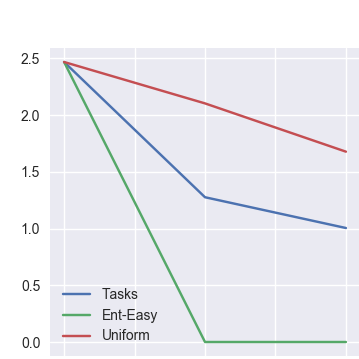

<IPython.core.display.Javascript object>


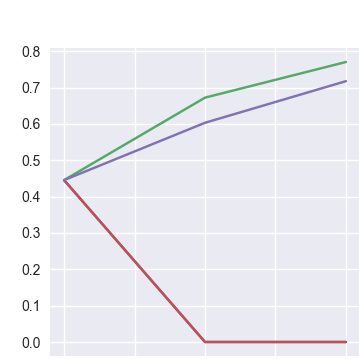

<IPython.core.display.Javascript object>


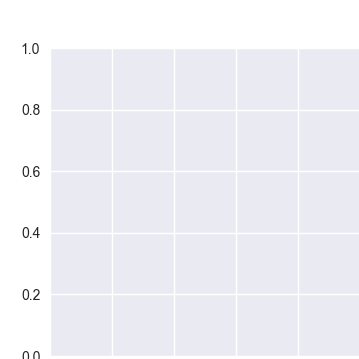

<IPython.core.display.Javascript object>


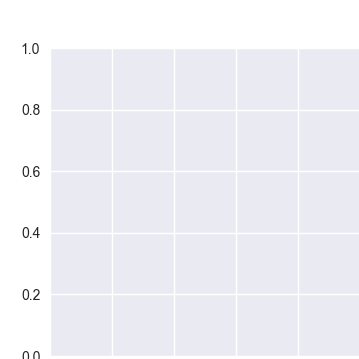

0
101.68494
Epoch 1/1
1/1 [==============================] - 0s 481ms/step - loss: 2.6828 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9277 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6411 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7547 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5578 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5752 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6877 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9994 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6547 - categorical_ac

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4943 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8874 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9385 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8326 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6781 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5136 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7531 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6643 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7762 - categorical_accuracy: 0.0000e+00
Epoch

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6858 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9074 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8056 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6394 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5101 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6487 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7531 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5200 - categorical_accuracy: 0.0000e+00
Epoch

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9873 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7922 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5663 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9177 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8672 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6032 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6856 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7870 - categorical_accuracy: 0.0000e+00
Epoch

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5900 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5075 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7549 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4974 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5011 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6258 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5637 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7746 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7889 - categorical_accuracy: 0.0000e+00
Epoch

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8595 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7789 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4553 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6571 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9216 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7327 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8403 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4737 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5252 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9054 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7504 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7853 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7336 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7595 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6595 - categorical_accuracy: 0.0000e+00
Epoch 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4449 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6478 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6391 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6523 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6152 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6409 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4695 - categorical_accuracy: 1.0000
Epoch 1/1


1/1 [==============================] - 0s 2ms/step - loss: 2.3920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8707 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7116 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4569 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7138 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7199 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6939 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4983 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6606 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3704 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6070 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5191 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5567 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8444 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4547 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0192 - categorical_accuracy: 0.0000e+00
Epoch

1/1 [==============================] - 0s 1000us/step - loss: 2.4260 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3825 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9321 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5648 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8718 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5643 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3981 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1787 - categorical_accuracy: 1.0000
Epoc

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8125 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.9852 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7330 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5953 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7879 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5817 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4914 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7624 - categorical_accuracy: 0

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4976 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5724 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5189 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5495 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5277 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5278 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4685 - categorical_accuracy: 1.0000
Epoch 1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5249 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6414 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3026 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0834 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0562 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3782 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8181 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6188 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7217 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1602 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6326 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3957 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5491 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.1146 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6464 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9160 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5226 - categorical_accuracy: 0.0000e+0

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4428 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5351 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6422 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4742 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4432 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5163 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2452 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3122 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 3.0012 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4682 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4352 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6597 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6730 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5305 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4582 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4934 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8924 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5788 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3070 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8681 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3100 - categorical_accuracy: 1.0000
Epo

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3488 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8505 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8873 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6870 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5181 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7233 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2221 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8918 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3109 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5758 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6842 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1572 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5251 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6680 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.0094 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2964 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4884 - categorical_accuracy: 0.0000

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8780 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6693 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.6451 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6435 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8505 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3501 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5056 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1725 - categorical_accuracy: 1.0000
E

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0572 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3555 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7491 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5741 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5000 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4606 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8763 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2143 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2230 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5575 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8547 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4100 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4942 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5410 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1444 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7357 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4986 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6639 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4608 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7887 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4422 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8739 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7823 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6374 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4750 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8565 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2436 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.3010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6209 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7019 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.6498 - categorical_accuracy: 0.0000e+00
Epo

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7493 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5533 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8603 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9240 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5808 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3222 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4184 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2618 - categorical_accuracy: 1.0000
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2992 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4507 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2771 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2164 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.1547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.0798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9657 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1695 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6339 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3920 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5034 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2151 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9139 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4133 - categorical_accuracy: 0.0000e+00
Ep

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5885 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1554 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6308 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6121 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.3893 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3617 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6729 - categorical_accuracy: 0.0000e+00
Epoch 1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6342 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3686 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6821 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6966 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8696 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4833 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6657 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8161 - categorical_accuracy: 1.0000
Epoch

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2399 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7170 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4689 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.1047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2674 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3620 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4964 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5332 - categorical_accuracy: 0.0000e+00


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0350 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6031 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8398 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4883 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2196 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5603 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6643 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4315 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6383 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1539 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3641 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9267 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1843 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4638 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7160 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0777 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3332 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2517 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5041 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3871 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6055 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6859 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2946 - categorical_accuracy: 0.0000e+00
Epoch

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.0900 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9470 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3178 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4000 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3105 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2910 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4976 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4635 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4892 - categorical_accuracy: 0.0000e

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6853 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7628 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4042 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5160 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5859 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6243 - categorical_accuracy: 0.0000e+00
Epoch 1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6133 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7222 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4677 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4344 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9192 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6212 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3674 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8775 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4821 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5125 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.8986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6442 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3401 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7510 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4589 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3462 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3320 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6875 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.0435 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6491 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.1711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6815 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5403 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1967 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0896 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.7267 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0573 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3984 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7941 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1494 - categorical_accuracy: 0.0000e+00
Ep

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9601 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0482 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3434 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2692 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8398 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3281 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8470 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8933 - categorical_accuracy: 0.0000e+00


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0692 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5400 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2140 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5742 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0484 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7416 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6973 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4416 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4243 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8459 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1691 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3137 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4434 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8540 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0620 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5723 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2743 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.1483 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2434 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2681 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6710 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2645 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0426 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1595 - categorical_accuracy: 0.0000e+00
Epo

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6600 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8582 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5549 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3223 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5552 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8562 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1997 - categorical_accuracy: 0.0000e+00


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1702 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3648 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8289 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0098 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.1225 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1719 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8030 - categorical_accuracy: 0.0000e+

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8401 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2186 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4163 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1442 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0626 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2540 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6407 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5745 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2128 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5150 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5296 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9813 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0762 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4402 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.5661 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3871 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3005 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.8770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5769 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9140 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6703 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7250 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9850 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9241 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 3.2079 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1266 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8036 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5988 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5425 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5572 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8297 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7146 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4706 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3337 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1372 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6265 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4113 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0491 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0673 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1638 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3013 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2782 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.7886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3072 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3690 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5982 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2554 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0305 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0096 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1317 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2642 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1651 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2271 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.3135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.2144 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0852 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5096 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2006 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6136 - categorical_accuracy: 1.0000
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0792 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3211 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7293 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3747 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.4550 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6631 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4307 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8490 - categorical_accuracy: 1.0000
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2470 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0732 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3624 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2107 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7241 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5353 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5898 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1014 - categorical_accuracy: 0.0000e

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2204 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3582 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1781 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1797 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8517 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5480 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5153 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9908 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.1099 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5581 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9961 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2269 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3018 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1845 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5494 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.0028 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9157 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8458 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8737 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3727 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3308 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0653 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5828 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0289 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3278 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3001 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2447 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1778 - categorical_accuracy: 0.0000e

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8158 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0573 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0783 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4017 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4052 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6454 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5158 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0190 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7404 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5516 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6809 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.7645 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3584 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6110 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8643 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8885 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5007 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9512 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9259 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2444 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3878 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2112 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9906 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3085 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9229 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3688 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0657 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7130 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1684 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1771 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5237 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5626 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5180 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8541 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5331 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0039 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0484 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3997 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4446 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1769 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5315 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5015 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0877 - categorical_accuracy: 1.0000
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8677 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3721 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3558 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2296 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9646 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0046 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4452 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8013 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3986 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1726 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9990 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8059 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.0928 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8853 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4218 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6047 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2988 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2573 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9897 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3286 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2410 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1281 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.6325 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7092 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2635 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5929 - categorical_accuracy: 0.0000e+00
Ep

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9563 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2633 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7712 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5969 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7716 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5895 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2121 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7269 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9502 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0211 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0414 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2839 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8697 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2793 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5205 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6971 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2819 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2632 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0363 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3947 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8135 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3597 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1732 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3147 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5739 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5422 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3534 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3842 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1179 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3300 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.0064 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3169 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5801 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7486 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3723 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0466 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2853 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8539 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 2.3132 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1763 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2483 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2183 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3059 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 2.5426 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6855 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1105 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5859 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2973 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8612 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8893 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.6707 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.0534 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6910 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6481 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4722 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5306 - categorical_accuracy: 0.0000e+00
Epoc

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6002 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4308 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5840 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1128 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9020 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1076 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0207 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3233 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9164 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2518 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2041 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6856 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6911 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.7463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1077 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6810 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8399 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3615 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5550 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8427 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8335 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7345 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8188 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7240 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1516 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7288 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0571 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2986 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9057 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0084 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4226 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1579 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6685 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6270 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6402 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5457 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4388 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0557 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6354 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5293 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0179 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4490 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6417 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5938 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8967 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8172 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6854 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9020 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6263 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0299 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5689 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3143 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.0723 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2389 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.1709 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1909 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0687 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8298 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8689 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8599 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7074 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0528 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3738 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8423 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6399 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6466 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7213 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9164 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.7239 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2402 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7260 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4598 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5499 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9124 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4940 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7579 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8295 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8756 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5940 - categorical_accuracy: 1.0000
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7220 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6458 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.3010 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6932 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8198 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9573 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1528 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8430 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2339 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1266 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2933 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.9597 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7661 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2449 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1349 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1834 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8482 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7176 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1125 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0127 - categorical_accuracy: 0.0000e+00
Epoch 1/1

1/1 [==============================] - 0s 2ms/step - loss: 2.3746 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6476 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9171 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4149 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8905 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9810 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0564 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5708 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.7243 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1772 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1370 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6411 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5632 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6607 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7810 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4969 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6198 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8390 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8764 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1027 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7252 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8910 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5254 - categorical_accuracy: 0.0000e+00
Epoch 1

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.2513 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4508 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5410 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9634 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9058 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6206 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1038 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7620 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9069 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3579 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5742 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.2246 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4190 - categorical_accuracy: 1.0000
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6253 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0640 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3717 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4491 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6504 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0402 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2052 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7588 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2937 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1282 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6430 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.7626 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8158 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0735 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9604 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3803 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8957 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8680 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5830 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0619 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5406 - categorical_accuracy: 1.0000
Epoch 1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9299 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.1487 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8664 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4846 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8070 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8481 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8942 - categorical_accuracy: 0.0000e+00
Epoch 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5150 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0094 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7489 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9409 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8168 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3800 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1368 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0505 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7829 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9288 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5187 - categorical_accuracy: 1.0000
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7200 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7327 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2597 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2940 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1968 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1979 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8221 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7666 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.2771 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0804 - categorical_accuracy: 1.0000
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6750 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5743 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4697 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4743 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4164 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0672 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4479 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8152 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0899 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4383 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6251 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6328 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5063 - categorical_accuracy: 1.0000
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7376 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4078 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.9106 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7650 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6336 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0489 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9332 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8093 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.2163 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6553 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3778 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5756 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0004 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3917 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1771 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8211 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1094 - categorical_accuracy: 1.0000
Epoch 1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6727 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2885 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0626 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7540 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2337 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 4.2273 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.8769 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3064 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1076 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5114 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8584 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.9261 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1317 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9680 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9397 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3221 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6405 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8599 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0503 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9647 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5516 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7143 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8777 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0585 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1625 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3863 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4096 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8974 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4661 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4567 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4211 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9258 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2332 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1182 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3110 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6256 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8914 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6936 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4368 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5147 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8736 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5272 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7010 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7521 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7512 - categorical_accuracy: 0.0000e+00
Epoc

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6266 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0815 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9059 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8297 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4186 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3461 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3478 - categorical_accuracy: 1.0000
Epoc

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0905 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4571 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9320 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0214 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

1/1 [==============================] - 0s 2ms/step - loss: 1.4751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1696 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8446 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.8122 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4043 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3665 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1839 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0456 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4557 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8026 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6042 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3126 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4780 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7607 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5699 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2016 - categorical_accuracy: 1.0000
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0113 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.7357 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0730 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1955 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9350 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7975 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4800 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3388 - categorical_accuracy: 0.0000e+00
Epoch 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7974 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3643 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8102 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4460 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7537 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8372 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.1326 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.7163 - categorical_accuracy: 0.0000e+00
Epoch 1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7311 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6724 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4819 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7525 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4550 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1957 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1517 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5294 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2581 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7158 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3567 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7340 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7896 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 2.9266 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2243 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6378 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7038 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7199 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7578 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4850 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9385 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=========

1/1 [==============================] - 0s 1ms/step - loss: 1.5329 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3286 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7743 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3091 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1629 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8548 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8971 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 1.7636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9208 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3362 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1263 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4647 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7125 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=========

1/1 [==============================] - 0s 2ms/step - loss: 1.8688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5596 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7800 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.3433 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6269 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9125 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3564 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3631 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2137 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6092 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2028 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1266 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1221 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5831 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8874 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5144 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4356 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0330 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9797 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1329 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5309 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7304 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3915 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3282 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5526 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9132 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3593 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

1/1 [==============================] - 0s 2ms/step - loss: 1.9278 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9309 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5292 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6848 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1677 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8730 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2399 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1344 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9172 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3617 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4098 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2129 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3494 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6186 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5545 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0460 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1545 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3450 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7813 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2271 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8704 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9070 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2452 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5225 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.8519 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7698 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7753 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7286 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8721 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8928 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4556 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8357 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0671 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6290 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.1062 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7944 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7288 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.5487 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1044 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

1/1 [==============================] - 0s 2ms/step - loss: 1.2979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3347 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7577 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6608 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9348 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0236 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8021 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8643 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2889 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4240 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9105 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4938 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1955 - categorical_accuracy: 1.0000
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8867 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6391 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6833 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8526 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4640 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8733 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4849 - categorical_accuracy: 1.0000
Epoch 1

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0462 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4265 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7862 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9088 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5759 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1884 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8770 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7664 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7863 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1425 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8135 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7117 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3290 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9627 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8379 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0417 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7456 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4184 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3178 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0435 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9200 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2416 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0556 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6484 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5091 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0505 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0389 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3328 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3092 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5692 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7643 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2499 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6646 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0481 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8760 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1238 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0524 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5361 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7305 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4155 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1561 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0991 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8172 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4601 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8433 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3540 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6829 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4557 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

1/1 [==============================] - 0s 2ms/step - loss: 1.4004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0496 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6467 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6096 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4438 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8152 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9574 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3182 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2489 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6465 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9774 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6557 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0057 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4366 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9536 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5819 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5546 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4383 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3571 - categorical_accuracy: 0.0000e+00
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7337 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.1498 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7383 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3505 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1272 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6362 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4369 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1427 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9261 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2669 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8151 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1199 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3875 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3699 - categorical_accuracy: 0.0000e+00

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9000 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5497 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9498 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5516 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2301 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5745 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7332 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6427 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3523 - categorical_accuracy: 1.0000
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0480 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7019 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1136 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0325 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

1/1 [==============================] - 0s 2ms/step - loss: 0.8162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6069 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5929 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0871 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4453 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1474 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====================

1/1 [==============================] - 0s 2ms/step - loss: 2.6349 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.2613 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6443 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.6818 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1391 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6749 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3444 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1651 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3864 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4220 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2113 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6394 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9480 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3629 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9677 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8468 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6299 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5614 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8216 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7553 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5192 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6482 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2200 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8718 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3383 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8041 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8993 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8966 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9579 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7538 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3457 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9977 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4959 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6167 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0026 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6431 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2191 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5679 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7014 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0534 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1538 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1177 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2857 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0892 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.3529 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5287 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6654 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2247 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8465 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3981 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3964 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0935 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8831 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0468 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4125 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1522 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7967 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5350 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7064 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.7975 - categorical_accuracy: 0.0000e+00
Epoch

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5427 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9108 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6475 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9967 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0217 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7402 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8921 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8293 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6051 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8400 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8861 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6391 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5553 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9532 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9263 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1520 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

1/1 [==============================] - 0s 2ms/step - loss: 1.8685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3136 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2544 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3033 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7919 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7683 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7933 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6053 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1888 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1378 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2166 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8568 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1360 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0460 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5133 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0251 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1093 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1974 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3811 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0421 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9184 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2345 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7751 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9738 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7691 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7645 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.5369 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5723 - categorical_accuracy: 0.0000e+00
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6394 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8669 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.4727 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2147 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4928 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9219 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4059 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.6735 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4454 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3278 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2839 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5325 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5330 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3469 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1038 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8547 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1282 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3409 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5481 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5836 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8462 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0106 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7141 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7510 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7551 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6301 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2954 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8758 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3847 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2716 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3518 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5619 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5401 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8369 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0789 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4394 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0667 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6259 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6977 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4018 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4302 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6294 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0230 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2764 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3475 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

1/1 [==============================] - 0s 1000us/step - loss: 1.5543 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4698 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7985 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1228 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1150 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5169 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1909 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7256 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0779 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8385 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0613 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1727 - categorical_accuracy: 1.0000
Epoch 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4702 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5653 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8844 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4695 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3481 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0524 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

1/1 [==============================] - 0s 1000us/step - loss: 3.2102 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0911 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7562 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1413 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2702 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0853 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5278 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

1/1 [==============================] - 0s 2ms/step - loss: 1.2942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9262 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0409 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0608 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5943 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1778 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6424 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4047 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4418 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3051 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8352 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9983 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2005 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5933 - categorical_accuracy: 0.0000e+00
Epo

1/1 [==============================] - 0s 2ms/step - loss: 2.4688 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8388 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5086 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6378 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2710 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0422 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1530 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9687 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9453 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0797 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1487 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6719 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5228 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1934 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6165 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2575 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.4019 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9018 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1385 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0318 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0480 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9964 - categorical_accuracy: 0.0000e+00
Epoc

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0530 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3114 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6188 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8531 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1940 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6403 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6466 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9166 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6239 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2920 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3192 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9566 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7711 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5123 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8716 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

1/1 [==============================] - 0s 2ms/step - loss: 0.8499 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1849 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9212 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3723 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4937 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3790 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3165 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2112 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3080 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4828 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0662 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6591 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6644 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3583 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0507 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5260 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9199 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4773 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2417 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0007 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4733 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9421 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8003 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 3.1600 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9791 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6049 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2018 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

1/1 [==============================] - 0s 2ms/step - loss: 0.7025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4167 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.0584 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3860 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9003 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0105 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4753 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8765 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2837 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6370 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5999 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8350 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8084 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5339 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3245 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8788 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2556 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8596 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4687 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3977 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5374 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.4572 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5186 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6411 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9747 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8377 - categorical_accuracy: 0.0000e+00
Epoc

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9067 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0269 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7537 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8337 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5357 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6705 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8593 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9578 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9545 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.7287 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7573 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5905 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2759 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1709 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8387 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7225 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5643 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8928 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6304 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7414 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1621 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4972 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4423 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2044 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8589 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 2ms/step - loss: 1.5030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4433 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1322 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5066 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5460 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.2871 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9442 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7446 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2937 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8291 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3288 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8550 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

1/1 [==============================] - 0s 2ms/step - loss: 1.1341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3544 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7714 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2232 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5389 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7082 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5883 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2220 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4588 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0479 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.1668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.2175 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6175 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1041 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7174 - categorical_accuracy: 1.0000
Epoch 1/

1/1 [==============================] - 0s 2ms/step - loss: 2.0511 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3992 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0959 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6635 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7028 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5337 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6703 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4744 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0152 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3525 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5401 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6780 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0404 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8631 - categorical_accuracy: 1.0000
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4178 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8129 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2742 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9961 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5000 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 0.7041 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1032 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6637 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8953 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1806 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1631 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7308 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8438 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3378 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9108 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

1/1 [==============================] - 0s 1ms/step - loss: 1.0548 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3745 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9467 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3426 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9844 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2374 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5512 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1680 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4473 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6139 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9014 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1346 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1328 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

1/1 [==============================] - 0s 1000us/step - loss: 1.3341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.3949 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6545 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3903 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7205 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3482 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1425 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8860 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3994 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1835 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4088 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5941 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4717 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1073 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5114 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1828 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9077 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0726 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0646 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9820 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5589 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.1292 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8457 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6382 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.6631 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5346 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1951 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8751 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.5799 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4301 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5789 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3462 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4207 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9670 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.7740 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0467 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0545 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.2064 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4660 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1166 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

1/1 [==============================] - 0s 2ms/step - loss: 2.1517 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8022 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4934 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7969 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2781 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7161 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2155 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0688 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7699 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5797 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3727 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6215 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3771 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6434 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5043 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5448 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3825 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7496 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0438 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6345 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8896 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4745 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7352 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2532 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.8268 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0408 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0397 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2094 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5053 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4266 - categorical_accuracy: 1.0000
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2620 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5355 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5296 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8530 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5908 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1440 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3285 - categorical_accuracy: 1.0000
Epoch

1/1 [==============================] - 0s 2ms/step - loss: 0.4395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4707 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7040 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1513 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.7759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4241 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6748 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1416 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1092 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5422 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4301 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9088 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7159 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9740 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9540 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5646 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7923 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3393 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1448 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3679 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

1/1 [==============================] - 0s 2ms/step - loss: 1.6015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0056 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6073 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7682 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4026 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9178 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4554 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4911 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2329 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7604 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3209 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4528 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6852 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2008 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6929 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4304 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5373 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6350 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7437 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9188 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9423 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9358 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8584 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5604 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0863 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2599 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5821 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5269 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

1/1 [==============================] - 0s 2ms/step - loss: 2.0333 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8193 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1427 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8496 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7798 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5479 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8498 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5593 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4566 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2325 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5252 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1472 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8912 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4082 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1433 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7502 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5188 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6250 - categorical_accuracy: 1.0000
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1059 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2323 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7456 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1259 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7067 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7944 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3041 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3174 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0469 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0766 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2288 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0348 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3584 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2463 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8172 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8803 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9871 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7314 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0199 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9541 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8160 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0312 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0185 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6240 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6401 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7058 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5074 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3713 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4194 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5384 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6917 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9424 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1599 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1646 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4335 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4089 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7822 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2313 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4379 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9729 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7281 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6064 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6342 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3070 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1232 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1263 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3273 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1667 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3974 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8756 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6130 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9858 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7722 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5542 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2203 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9729 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7787 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0575 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5775 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.6629 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7123 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5781 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9627 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7514 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0877 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9281 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1410 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1021 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9820 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4591 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0098 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0059 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7401 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1978 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.6285 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3327 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1502 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1053 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8105 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7942 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2972 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2488 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8722 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7512 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1050 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7589 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5014 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7153 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4859 - categorical_accuracy: 0.0000e+00
Epoch 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0586 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5175 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5584 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0391 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

1/1 [==============================] - 0s 1000us/step - loss: 2.5881 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2301 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1350 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0346 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7310 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3425 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6358 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5568 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4910 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0962 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9069 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4532 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4755 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4155 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2404 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2379 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4597 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3560 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0488 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0630 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1706 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 5.4215 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3306 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4702 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6858 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9871 - categorical_accuracy: 1.0000
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2343 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5660 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1650 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.0087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0530 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8032 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2539 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.8677 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5840 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5494 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6368 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3222 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 2ms/step - loss: 0.7144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0390 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9277 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8441 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5970 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3664 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1069 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0703 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4194 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6851 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9844 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0888 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7705 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0364 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7187 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9489 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

1/1 [==============================] - 0s 2ms/step - loss: 1.7056 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.5838 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9584 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8657 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9326 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3041 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8182 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0265 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9504 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6277 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2042 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7448 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6608 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9695 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8264 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2163 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4316 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5574 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4424 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2598 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.8811 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5353 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9493 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9026 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8025 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6311 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4345 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7303 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7268 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6140 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1414 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5160 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6330 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0897 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8232 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0764 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8117 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9362 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4599 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2303 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8812 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4618 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2215 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1290 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1653 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3591 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4379 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6096 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4834 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6367 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5713 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5662 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5988 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0561 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7228 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2565 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5055 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3064 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6799 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4386 - categorical_accuracy: 0.0000e+00
Epoch 1/1


1/1 [==============================] - 0s 2ms/step - loss: 2.9041 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8200 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2166 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7498 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7204 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7289 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6495 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1880 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9769 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0118 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5585 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3291 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5673 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0934 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3625 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3007 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0939 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2351 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0491 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6549 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4469 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6242 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3616 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8560 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7522 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9269 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

1/1 [==============================] - 0s 1000us/step - loss: 1.0093 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5641 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1241 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1395 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5146 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2940 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5077 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1739 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0217 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

1/1 [==============================] - 0s 2ms/step - loss: 0.4021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9486 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8476 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4415 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4137 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9701 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2782 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.6006 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.1478 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4118 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5238 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4157 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4545 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8036 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3209 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2514 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1794 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4441 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7435 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0377 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8660 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8943 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7546 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8526 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3131 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9670 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4627 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6545 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9001 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8093 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3877 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6516 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8641 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2348 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2454 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8717 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1577 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4604 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3290 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0984 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4244 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7792 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0988 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6880 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9970 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1733 - categorical_accuracy: 1.0000
Epoch 1/1


1/1 [==============================] - 0s 2ms/step - loss: 1.8047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5507 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.1224 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.7509 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6380 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1163 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6922 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7539 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7552 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5050 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5823 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8662 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9531 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9021 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3885 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3357 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2354 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7331 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3546 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5467 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.1650 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3443 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6390 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4561 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1071 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7953 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4968 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4845 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7812 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2301 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5385 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7189 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9921 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3191 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7821 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7895 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9540 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2475 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7410 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9643 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6689 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4984 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4571 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7591 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8114 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9675 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.7689 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1594 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8449 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.3208 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9803 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0339 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2571 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1348 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8457 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7814 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2981 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0476 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9980 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4987 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1340 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4933 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5680 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5613 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1611 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7410 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7494 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3483 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3488 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0575 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7078 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6609 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6260 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3580 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7530 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4494 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3762 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0552 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4499 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9071 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0527 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0343 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5466 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0207 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.1630 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4068 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

1/1 [==============================] - 0s 2ms/step - loss: 2.5255 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7830 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6739 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5334 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8223 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2567 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8043 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5524 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5200 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3333 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3893 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5560 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5168 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9358 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6188 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6309 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1075 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6179 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8000 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9473 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5060 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5598 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4513 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.2955 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1684 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2183 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

1/1 [==============================] - 0s 2ms/step - loss: 1.6151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6527 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8727 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6327 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8028 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0847 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5236 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9275 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0418 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7385 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

1/1 [==============================] - 0s 2ms/step - loss: 1.1314 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8428 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5905 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0679 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0466 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2870 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5438 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9581 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4142 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

1/1 [==============================] - 0s 2ms/step - loss: 1.0304 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2391 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9390 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5700 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7017 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=====================

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.7500 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6459 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6422 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6286 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.0769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3565 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0242 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9568 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9860 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0840 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4657 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3657 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5872 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3936 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.4109 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0388 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8549 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9466 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2476 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5502 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1969 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

1/1 [==============================] - 0s 2ms/step - loss: 0.3759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3425 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4468 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5146 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1920 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3393 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8790 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9619 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4031 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7762 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5723 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3750 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3054 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1160 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.3555 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5340 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3382 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5326 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.7111 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1541 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4172 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8467 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2436 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4556 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6670 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6399 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0518 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0401 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6134 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5420 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4870 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3289 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6835 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6526 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.8721 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4279 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.4179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4587 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1391 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7924 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2810 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2191 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0428 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.8924 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9486 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8959 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9813 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6109 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1711 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6677 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4248 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6178 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5527 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.3447 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0921 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.3648 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8282 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5821 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9429 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4350 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8592 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0285 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5181 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.6231 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6562 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

1/1 [==============================] - 0s 2ms/step - loss: 1.7184 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5714 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6055 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1379 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.7701 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8463 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7422 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8601 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6117 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3529 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2021 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6621 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3430 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3738 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0635 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1277 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6257 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1704 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1146 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 7.4567 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0407 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0183 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6394 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7286 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5573 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4545 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

1/1 [==============================] - 0s 2ms/step - loss: 0.6429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8068 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5076 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4535 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6616 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0013 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4749 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9500 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9013 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7520 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8507 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6823 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2920 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6643 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7063 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.6236 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7059 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8675 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3706 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6350 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3594 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1380 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7323 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6422 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4368 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4506 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5016 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3810 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0694 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.0571 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6883 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3329 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6922 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6437 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5477 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3200 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3554 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9469 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3687 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9313 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3160 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5759 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5499 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0102 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

1/1 [==============================] - 0s 2ms/step - loss: 0.5925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1147 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5568 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0567 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4413 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1900 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8625 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5520 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5206 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5239 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1438 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2974 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1158 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7521 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2318 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4112 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6032 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3566 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4561 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

1/1 [==============================] - 0s 2ms/step - loss: 3.1250 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9301 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8030 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3775 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7561 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4602 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3536 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9331 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6831 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9380 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1880 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5069 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9379 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9068 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4115 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4175 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3714 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3687 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1187 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.0834 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7077 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7151 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5381 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8301 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7101 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5580 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4528 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3457 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7833 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7463 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1986 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7438 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6071 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3216 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1443 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3966 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6160 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5115 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1309 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4063 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0470 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9377 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.1926 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7336 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8566 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.3575 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9094 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9765 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7006 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6095 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2940 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2650 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7451 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1972 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4412 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0029 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5674 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9773 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5838 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6512 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7221 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.4856 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3282 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8366 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4627 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4581 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4358 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5744 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3542 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4771 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.8235 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0852 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7231 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9325 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3795 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5586 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4276 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0194 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9967 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3560 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9837 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.1421 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5239 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6002 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9361 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

1/1 [==============================] - 0s 2ms/step - loss: 0.7012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.1210 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3297 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1164 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6016 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3240 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8387 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9738 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8177 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2626 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5513 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3414 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1128 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7055 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5782 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0160 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0753 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3907 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6571 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5969 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1502 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1816 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7214 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7121 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7334 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6953 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3662 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8146 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5394 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

1/1 [==============================] - 0s 2ms/step - loss: 2.0552 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8399 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.3266 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4456 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3700 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5489 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.7403 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7278 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6601 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.6668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4912 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0854 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5136 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0003 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.9451 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3502 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8292 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7239 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0207 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7615 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5219 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6492 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6032 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3013 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2482 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7485 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0940 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9075 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7352 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6767 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5164 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0654 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7538 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6037 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2112 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6925 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2193 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.3807 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1098 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6365 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3175 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.2840 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2109 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9049 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4423 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.0227 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6404 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7117 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5660 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3482 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5256 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0686 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4592 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9002 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7793 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5895 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0189 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9490 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0510 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4675 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3314 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9448 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6727 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0549 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8848 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6158 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3357 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4526 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6037 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2259 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5883 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1378 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9123 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9390 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9999 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6871 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8109 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2869 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5417 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4456 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9755 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2658 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3228 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4548 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2172 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3981 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8661 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1427 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5523 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8679 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3133 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4640 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4962 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4076 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9199 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9598 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7568 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3166 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2094 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1563 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4810 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3426 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8023 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3169 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.7180 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3885 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5136 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4112 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9371 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7782 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3918 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8959 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3747 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0024 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5101 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4945 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6567 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3948 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9771 - categorical_accuracy: 0.0000e+00
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4793 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2787 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7243 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.4421 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4118 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.1206 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0606 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1282 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9164 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.5534 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

1/1 [==============================] - 0s 1000us/step - loss: 2.0793 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3676 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5468 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9407 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5187 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3844 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4833 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7378 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9313 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5831 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4625 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2383 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7296 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3256 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7230 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7969 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9589 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.6914 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 4.4477 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3955 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6723 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4358 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1939 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3209 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5727 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3958 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6373 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7441 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6270 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3511 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3567 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9463 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9147 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5591 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5005 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.1366 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3408 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6087 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3666 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8020 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7581 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5824 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2240 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5236 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3671 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3911 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5528 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3206 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.0205 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4362 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1781 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5194 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1240 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8288 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3114 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5471 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0513 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5813 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3511 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8651 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3368 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3778 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

1/1 [==============================] - 0s 2ms/step - loss: 0.3820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5778 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7742 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2329 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1894 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7379 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9284 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4661 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0520 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5594 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5162 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6679 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7723 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5594 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3397 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1884 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9666 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2445 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8792 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3574 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8477 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1805 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7415 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.7665 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7240 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3314 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4820 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0803 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4992 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2141 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8575 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1086 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7535 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3475 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4720 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2757 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7544 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9272 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3657 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 1.9018 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3512 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2314 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7821 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8299 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7104 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4564 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6600 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1258 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3552 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8492 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6895 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0737 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.2519 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8846 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8265 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4387 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8634 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5612 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4277 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4882 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1985 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4873 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9036 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4306 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4743 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1516 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2873 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7144 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8297 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5580 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8727 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5674 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6832 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5702 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1257 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3621 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4911 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4701 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.1312 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8500 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9761 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1429 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9258 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6908 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6480 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9462 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0206 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2071 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8863 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.3152 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8784 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7328 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7267 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6067 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7747 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4315 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0744 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8514 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.5708 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2698 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2089 - categorical_accuracy: 0.0000e+00
Epoch 1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0024 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4043 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8834 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5468 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2390 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3717 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3550 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.2296 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9734 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9312 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1146 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4907 - categorical_accuracy: 1.0000
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4518 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5239 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4968 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5512 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1293 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1465 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0939 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8252 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4604 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5414 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6437 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1096 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.0244 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8691 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6515 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2287 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0448 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3150 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.9112 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8900 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2314 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0820 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6357 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4643 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3519 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4533 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4863 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2163 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3499 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4701 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1713 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4688 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8286 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5477 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5561 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4743 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4118 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9310 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.0578 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3557 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3559 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3315 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.3249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7671 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0962 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0382 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6684 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5609 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6479 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3880 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4687 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9473 - categorical_accuracy: 1.0000
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3033 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0591 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6670 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0842 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1263 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6187 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1710 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8349 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5039 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0178 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3075 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0819 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7475 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3352 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.8238 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0903 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5664 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1554 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5812 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3626 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8850 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.9467 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0285 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2635 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0192 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6746 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6855 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1277 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3822 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7888 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3299 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7313 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3462 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4491 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5645 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7103 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9917 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5661 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9254 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3739 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1381 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7391 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4323 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5572 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7423 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9577 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5872 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5913 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.3927 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5780 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8456 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5474 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3967 - categorical_accuracy: 1.0000
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8311 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8922 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4529 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3742 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9375 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6703 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0070 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8969 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3413 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4121 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8612 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4094 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5098 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7437 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7350 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6322 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3394 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6966 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5181 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4672 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9154 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1207 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6369 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6325 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8976 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7109 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1955 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7536 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3414 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.0705 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1809 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8268 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3116 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9094 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.9368 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9999 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5333 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7553 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2194 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5488 - categorical_accuracy: 1.0000
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2235 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9092 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5043 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4191 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0150 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6166 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4324 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7319 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3814 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5178 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2245 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3982 - categorical_accuracy: 1.0000
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8275 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5093 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9433 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6403 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4951 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

1/1 [==============================] - 0s 1000us/step - loss: 1.3159 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.3542 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4069 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1378 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 1.1213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5634 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0984 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0749 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3543 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4264 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1441 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8765 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4413 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4451 - categorical_accuracy: 1.0000
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5193 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4217 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3941 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5629 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4104 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1998 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2972 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2973 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3959 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7716 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0093 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9402 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0370 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0175 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3163 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1255 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2698 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6315 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7500 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8688 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.4759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2498 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1474 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9885 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4337 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4798 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2192 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5544 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6414 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7611 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5797 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3575 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2825 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7934 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7302 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3116 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5243 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

1/1 [==============================] - 0s 2ms/step - loss: 0.3855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9341 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3218 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9056 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8573 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8513 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2029 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2263 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5551 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3305 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1449 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9178 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3660 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3056 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.7265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0060 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0023 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0520 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

1/1 [==============================] - 0s 2ms/step - loss: 1.6303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3268 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9895 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6377 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3494 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4603 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6060 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3202 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6270 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6956 - categorical_accuracy: 1.0000
Epoch 1/1

1/1 [==============================] - 0s 1ms/step - loss: 0.4177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5162 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9201 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5003 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6334 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6367 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6388 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3166 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6267 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6676 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4646 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9591 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3178 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1437 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5608 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4360 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4307 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6377 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8796 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9454 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8177 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9464 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0483 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3130 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4401 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4314 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3592 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2578 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7956 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3357 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1078 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5043 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6515 - categorical_accuracy: 1.0000
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6375 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6314 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4354 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3454 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5600 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8350 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0665 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5073 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0908 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5174 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3428 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5354 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1923 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6515 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8564 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7480 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6297 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0710 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0378 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6511 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8479 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.4788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7162 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3675 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2333 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9165 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3520 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6717 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6599 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5758 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8123 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9923 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5628 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3410 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0596 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4868 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2361 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0127 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5531 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4609 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8558 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6127 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9459 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2450 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8408 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0614 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1259 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7391 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9690 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3053 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4093 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8534 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5577 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5120 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1305 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5154 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9732 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4022 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7560 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2632 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4073 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4352 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4879 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0827 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3330 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5456 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7075 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5188 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2158 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8477 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5037 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3484 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3513 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5661 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8561 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9043 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9511 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2383 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0476 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5430 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4502 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0382 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3232 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2271 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4842 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3467 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3502 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3500 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3877 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3466 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9518 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7149 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2128 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6312 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4352 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4520 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0068 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1611 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9566 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1952 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4112 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3328 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8137 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1188 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5648 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3232 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3109 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7514 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9418 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9544 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8328 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5637 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6702 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4495 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1194 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7312 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5365 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3329 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5516 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7767 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4548 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5332 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8178 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7339 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4582 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4735 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8403 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1994 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4354 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6572 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3229 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8584 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5994 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9519 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6110 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2607 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0155 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0435 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5859 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5702 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6096 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9382 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3820 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7290 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4541 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2768 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3689 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3627 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3053 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2437 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9496 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5448 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7082 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3558 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3385 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3689 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6585 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4227 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3476 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9233 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3475 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3354 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5500 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4514 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6064 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8977 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4593 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3599 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3365 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3378 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3588 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

1/1 [==============================] - 0s 1000us/step - loss: 0.3636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4305 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.9000 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6435 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.2986 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3565 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.5669 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3112 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8365 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4190 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5323 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.9557 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5064 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9118 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4548 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5544 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9644 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=====

1/1 [==============================] - 0s 2ms/step - loss: 0.6853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4286 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3255 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2864 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6488 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0598 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3423 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3574 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

1/1 [==============================] - 0s 2ms/step - loss: 0.4472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7357 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.5177 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5329 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3431 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4155 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9456 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9089 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6477 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3076 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0501 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8394 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

1/1 [==============================] - 0s 2ms/step - loss: 0.4151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5466 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8337 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5816 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9562 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8103 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1748 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3401 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5142 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 1000us/step - loss: 4.0642 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4317 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3380 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9833 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6807 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=================

1/1 [==============================] - 0s 1000us/step - loss: 0.3853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3082 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3390 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4469 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3299 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3567 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7514 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0260 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3477 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3163 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.6910 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6041 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3345 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.3806 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4660 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3637 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2994 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4486 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5338 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3611 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

1/1 [==============================] - 0s 2ms/step - loss: 0.3760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3538 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3121 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3067 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3451 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7424 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3239 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5111 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9618 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6052 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3531 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4071 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3468 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0397 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0239 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3939 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 1ms/step - loss: 0.3009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4588 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3565 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3327 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3384 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4742 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3499 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3426 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3660 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3311 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3096 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3060 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3183 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2959 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3109 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5101 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.2956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3163 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3297 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3111 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3365 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3023 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3331 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1193 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6647 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8647 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4197 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0321 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2236 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7160 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8493 - categorical_accuracy: 0.0000e+00
Epoch

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6231 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9945 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6096 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5613 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7780 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7388 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8373 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1268 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.2768 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0479 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1613 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5293 - categorical_accuracy: 1.0000
Epoc

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7083 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0558 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9055 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7671 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3281 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1076 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6098 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5283 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6402 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8826 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2279 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9967 - categorical_accuracy: 0.0000e+00
Epoch 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7462 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3889 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2286 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0748 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2264 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5888 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1360 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3766 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1538 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4102 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5953 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4997 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5329 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0909 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6024 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0682 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3346 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5030 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8859 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7632 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0119 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6693 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3907 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0520 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9350 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1246 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3566 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1152 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2983 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7929 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4371 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1845 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7962 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7885 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9665 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8448 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6270 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2283 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2591 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8785 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3418 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5089 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8454 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.3495 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7284 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3977 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2438 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0097 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0643 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4593 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3015 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8498 - categorical_accuracy: 

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9607 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8427 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4038 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6576 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1620 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5143 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8086 - categorical_accuracy: 1.0000
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7778 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1540 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1600 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9895 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4972 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1758 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8518 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3634 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4836 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.9501 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.9318 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3329 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6545 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6079 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1056 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4239 - categorical_accuracy: 0.0000e+00
Epoch

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5430 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0609 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0774 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0571 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8971 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1661 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8467 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7724 - categorical_accuracy: 1.0000


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7490 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3374 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0566 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0611 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5601 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6224 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3518 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5666 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7206 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2451 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5167 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0728 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6014 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4232 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7138 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6700 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0575 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2645 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1708 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2273 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4605 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1377 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5322 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6990 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2439 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6313 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6000 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9760 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6490 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7737 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0702 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9462 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0040 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9793 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4732 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1008 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5483 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0458 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0802 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0496 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0207 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6068 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5026 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6420 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4725 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4841 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3288 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3805 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2357 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2359 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9247 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6725 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7580 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1581 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5465 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9025 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0906 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3659 - categorical_accuracy: 1.0000
Epoch 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1593 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5862 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6297 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0591 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6315 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7222 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6484 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9220 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4599 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.7765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2788 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3967 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6668 - categorical_accuracy: 1.0000
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2815 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8127 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1234 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6020 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2677 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7490 - categorical_accuracy: 0.0000e+00
Epoch 1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2039 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3844 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3551 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6335 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1439 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9609 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.0682 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0230 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1257 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8111 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3546 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6234 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1278 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2076 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.8073 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5390 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3582 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4906 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9113 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8717 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4691 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

1/1 [==============================] - 0s 2ms/step - loss: 1.8031 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4763 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8188 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5554 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4427 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2509 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6189 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.6341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1372 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9381 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3430 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9778 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1379 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1607 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5412 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7539 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3541 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3369 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8660 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0558 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4582 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7904 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3169 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9057 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4975 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8496 - categorical_accuracy: 1.0000
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8826 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4877 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5577 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1526 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0783 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9642 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5986 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6539 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5171 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6646 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7450 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1817 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0320 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6376 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0448 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0471 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6190 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3119 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0932 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8408 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2324 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4718 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7271 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

1/1 [==============================] - 0s 1000us/step - loss: 1.2836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8658 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7727 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7423 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6513 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3143 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5577 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2840 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5901 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8022 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7986 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5123 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5652 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1769 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6360 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6418 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0354 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3815 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7130 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6554 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5290 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4655 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9155 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2080 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3335 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3113 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4982 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6103 - categorical_accuracy: 1.0000
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8611 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4628 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5554 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7178 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4593 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5560 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0543 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8830 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3939 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4507 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6155 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1408 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.2186 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3425 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4456 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0726 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0717 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.1313 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9501 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7504 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1182 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1587 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3702 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3206 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7585 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0290 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5469 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.6974 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 3ms/step - loss: 0.6949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6212 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2524 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3291 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5115 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1632 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.3975 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0906 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1929 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7212 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0309 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4704 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9135 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0057 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9456 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1639 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

1/1 [==============================] - 0s 1ms/step - loss: 2.1028 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.6862 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9376 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6202 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3629 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9950 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1459 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0152 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0505 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4965 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1906 - categorical_accuracy: 0.0000e+

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1243 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9530 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8559 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5600 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3550 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8964 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 7.0129 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9289 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6582 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9282 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

1/1 [==============================] - 0s 2ms/step - loss: 1.3387 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9427 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7450 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7256 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7164 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7916 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8783 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7621 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5922 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9160 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0520 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8643 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2677 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5354 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6600 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9646 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.3380 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7593 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5115 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1437 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0039 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5256 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7146 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6663 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8410 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2262 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4761 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6414 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1912 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4448 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8742 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7453 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3979 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8699 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7847 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9906 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8807 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2295 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3582 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3449 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5198 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1102 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6437 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8535 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3585 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6270 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6374 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8294 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6549 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1274 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1535 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2618 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9609 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2376 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8500 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8234 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1558 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0859 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8955 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0512 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6233 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3779 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1651 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1933 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8871 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0451 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

1/1 [==============================] - 0s 2ms/step - loss: 1.5250 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0499 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3369 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7231 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7617 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8245 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6803 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4617 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.6550 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8566 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7637 - categorical_accuracy: 1.0000
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5617 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8012 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4516 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5864 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3348 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1321 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5405 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.7703 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3565 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2782 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3534 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8504 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.6482 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8578 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8830 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8823 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9161 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

1/1 [==============================] - 0s 2ms/step - loss: 2.3916 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1703 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5232 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8374 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2989 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1591 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8105 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4684 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0479 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

1/1 [==============================] - 0s 2ms/step - loss: 0.3697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7872 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2982 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5457 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9504 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0548 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5165 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6143 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9454 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6918 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5383 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7423 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6155 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0185 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7380 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3100 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1923 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7328 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9397 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4098 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6572 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6395 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5689 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6358 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8991 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0724 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2312 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0350 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5092 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2596 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2800 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3726 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7457 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2309 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1338 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0378 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2580 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5168 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9857 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1201 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5453 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1899 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2977 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9105 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8562 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5561 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0277 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6525 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9061 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4777 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0974 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9001 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6741 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8205 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6239 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7219 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

1/1 [==============================] - 0s 2ms/step - loss: 1.7041 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5441 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3531 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5874 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2103 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2854 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5809 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5444 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8067 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2598 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8075 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

1/1 [==============================] - 0s 2ms/step - loss: 2.4645 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8454 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6854 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5888 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3892 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5382 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

1/1 [==============================] - 0s 2ms/step - loss: 1.0565 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3621 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8898 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6207 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4614 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7144 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5570 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0548 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0043 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4554 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9502 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.3608 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8862 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6211 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0568 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0101 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8285 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6105 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6664 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7227 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4559 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9506 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0756 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6290 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5217 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.0240 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9702 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9358 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3836 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1542 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4465 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3856 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9975 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4542 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8217 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8874 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5078 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4489 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0380 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6432 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9151 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0740 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5326 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 2ms/step - loss: 1.7032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9748 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4678 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8980 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4840 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0327 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0816 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3953 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2147 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6599 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2535 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2180 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6188 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4870 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6656 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7871 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0593 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.4304 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8833 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

1/1 [==============================] - 0s 2ms/step - loss: 0.7870 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7205 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8092 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8357 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6391 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4444 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4468 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9496 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4801 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7786 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4166 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4816 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8518 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1745 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2205 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6437 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4175 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4390 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.7984 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6921 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1680 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1346 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4198 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6820 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4286 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6993 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4365 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9170 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0592 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9104 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7859 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6568 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8916 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3456 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2610 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9155 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7077 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8340 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5131 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6471 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2796 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3747 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6502 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9110 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7202 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9492 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0679 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5160 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6751 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8394 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5225 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8610 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4111 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8055 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2011 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7616 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6964 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3942 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5176 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8612 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.2296 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8046 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9868 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6444 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6144 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1976 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6271 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5241 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4194 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7442 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0078 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5811 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6243 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1550 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9645 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3139 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5230 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5546 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5650 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3621 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4201 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6005 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8325 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7040 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6919 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7276 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5098 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6981 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8082 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9117 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5108 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6962 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0214 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

1/1 [==============================] - 0s 2ms/step - loss: 0.3145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8609 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.1955 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5456 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4396 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0115 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8614 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.5162 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0532 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7350 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6069 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6115 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0092 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0911 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6830 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9407 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2153 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4192 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.1207 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6727 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9037 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4343 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6261 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3432 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0339 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3959 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0728 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1377 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4467 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8367 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5966 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4287 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0759 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3649 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5123 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4575 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7719 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0118 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8189 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5102 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7278 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3088 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.1674 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3206 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6423 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9577 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5782 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6301 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2986 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4075 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8822 - categorical_accuracy: 0.0000e+00
Epoch

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7423 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3549 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8520 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1976 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7368 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1912 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5491 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9063 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9214 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3240 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9408 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3317 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2405 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8702 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1538 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1061 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5335 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9405 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6388 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9109 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0609 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6518 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1635 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6820 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7105 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1082 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3749 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8561 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0934 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6548 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0283 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2310 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9640 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4219 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1727 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2084 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4546 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3305 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.1445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.1423 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0500 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0421 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4460 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6135 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9134 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3820 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6995 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3495 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3974 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6289 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5836 - categorical_accuracy: 1.0000
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8298 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.3963 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 5.0451 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0271 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3447 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5494 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4115 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4011 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.5501 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4276 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7373 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7512 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4860 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8463 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6061 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4742 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3169 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2236 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4548 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0569 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1839 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1398 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1951 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0762 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8653 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4594 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3841 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0431 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6501 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0362 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3464 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2002 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3378 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4797 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5493 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0225 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7499 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2358 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7174 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6124 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5866 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6045 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0887 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9115 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1492 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5618 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5215 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3632 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4561 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4984 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1067 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4713 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9107 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6616 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5974 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4096 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5532 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5524 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2932 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0088 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 9.0560 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2798 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8691 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5556 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3909 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5444 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1049 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3088 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4305 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7919 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3164 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7201 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9601 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7514 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6582 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8283 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3994 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9310 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5020 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5121 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4158 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5426 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3618 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.2190 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6486 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.3982 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0357 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7023 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8061 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8365 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8112 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9323 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7384 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5037 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3241 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3312 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2174 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7793 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1019 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5953 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7413 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4199 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1354 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5577 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3719 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7635 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8079 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5321 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1345 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.8504 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0138 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4627 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4279 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5097 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7444 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3797 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3069 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9524 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5557 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4572 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1423 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3479 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7845 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7998 - categorical_accuracy: 0.0000e+00
Epoch

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9657 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8228 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7234 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3016 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0309 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4174 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2530 - categorical_accuracy: 0.0000e+00
Epoch 1

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9906 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6939 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9617 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5310 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6540 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4315 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1204 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7279 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2657 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6611 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2281 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3541 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6896 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0629 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6532 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1431 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3361 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8081 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0491 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6368 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6451 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6565 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6616 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4026 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4160 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5041 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9067 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0614 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9114 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7654 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7330 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3388 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4616 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6467 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0064 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8821 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5209 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6321 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3703 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9573 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6860 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9261 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6394 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3183 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5487 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8477 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.5149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4427 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.0810 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3544 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3507 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6156 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6067 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7656 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.5326 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7592 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1846 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3027 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7237 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4483 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7491 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8990 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0945 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0677 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4209 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2476 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6816 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4995 - categorical_accuracy: 1.0000
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6979 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9437 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8215 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7549 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3626 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0619 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2348 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2151 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1245 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8068 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1623 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6306 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3350 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4483 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3804 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.0420 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7038 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2873 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4431 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6872 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3850 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1075 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5544 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7995 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3508 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4421 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0588 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2426 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9675 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0121 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4688 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.2817 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3388 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0588 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4315 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8448 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8079 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3073 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7286 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3260 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5114 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3534 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3095 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3626 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8092 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7856 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5222 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3662 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3283 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6397 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8857 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1679 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3782 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7153 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4510 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6591 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7728 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3198 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8842 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3299 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7612 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5323 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5164 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7544 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 9.2614 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1058 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5367 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4191 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5741 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1390 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1760 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3115 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6827 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3496 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5177 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3243 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4702 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5331 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7267 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7361 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5556 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3492 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8391 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1460 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4323 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8374 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8848 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

1/1 [==============================] - 0s 1ms/step - loss: 0.4433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3430 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6531 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5744 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.6701 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3577 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9092 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8994 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3282 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5391 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7225 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2070 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0439 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5471 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.3239 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4620 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3382 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6321 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7251 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1551 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1508 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3983 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3816 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6807 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 1000us/step - loss: 4.5424 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5531 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9690 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3382 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4328 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3821 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3434 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9515 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0904 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6541 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6824 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1290 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4938 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8317 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.7694 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3183 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6471 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9177 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0144 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6646 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1020 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9656 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4327 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8591 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7557 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4333 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2866 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9403 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3305 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.7921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3756 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4662 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4367 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0935 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7178 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3857 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.0376 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3380 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5314 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4204 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5367 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5129 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5024 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0314 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5358 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3760 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8058 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4071 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4526 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3911 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1352 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5530 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0687 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1846 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5217 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3093 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7078 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3689 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7657 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0026 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5009 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6501 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2610 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9172 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8627 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3615 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9687 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8097 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9155 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2679 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3243 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4885 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3240 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7728 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7599 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0318 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 1000us/step - loss: 0.4458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5577 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8784 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3838 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5913 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4550 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9876 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4368 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3465 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6182 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7287 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8275 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4291 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7284 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9574 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4459 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8385 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7166 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5634 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1430 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4577 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3482 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5328 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5518 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5371 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5445 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8539 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6147 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1195 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1018 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3493 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2754 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4406 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1012 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3484 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4885 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6703 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4427 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7390 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4475 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5538 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4371 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4316 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2726 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3427 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3276 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4307 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3256 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6392 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2373 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9598 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5268 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1799 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6994 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4930 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3496 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3079 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5438 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9183 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3854 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1078 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4288 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3357 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3067 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3601 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7150 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0553 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3693 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3475 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1442 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0627 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2532 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5079 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4506 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9002 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4026 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1343 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4747 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3132 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7380 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3589 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3551 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8069 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5481 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3076 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0066 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3158 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6826 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0781 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3479 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3999 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3264 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3670 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0304 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0647 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4088 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4075 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5068 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9535 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0537 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7466 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3033 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9688 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0568 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4412 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8300 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4060 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2717 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2341 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0760 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9359 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3090 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8917 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3218 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3407 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3953 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.4977 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4287 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3402 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 2.8038 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6492 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7172 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5403 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

1/1 [==============================] - 0s 2ms/step - loss: 0.5386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3524 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0978 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4194 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0386 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4691 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1556 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4065 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5848 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4516 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3784 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3524 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4306 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.1711 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9111 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9703 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2975 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 1000us/step - loss: 0.3849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3584 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0796 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5010 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.0753 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3172 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4053 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.3306 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3966 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0290 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2999 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7660 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3290 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3492 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7043 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4087 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2152 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1479 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8973 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0753 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0257 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2153 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0329 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9465 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4117 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0598 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3114 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1931 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3369 - categorical_accuracy: 1.0000
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3499 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6120 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7065 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7851 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2909 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4403 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7121 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4594 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3067 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3513 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3399 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8425 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0705 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3217 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7064 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5274 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6209 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3920 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2407 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3103 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3311 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3191 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4484 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7194 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9726 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3479 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1622 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5241 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2619 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4450 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6835 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0876 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9560 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9694 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3358 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3546 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2606 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1396 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0690 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3501 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6264 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4144 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5149 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5402 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3084 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3500 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2572 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4414 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7139 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7576 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5405 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3598 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3551 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9156 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4448 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9864 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7466 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9155 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0663 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4552 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5103 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6678 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9854 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4615 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3598 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5559 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2416 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7482 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0459 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3026 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3038 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4296 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4514 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5253 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8014 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3724 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3667 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0135 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4413 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8437 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4069 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4379 - categorical_accuracy: 1.0000
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4465 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3426 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5994 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5301 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3328 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2403 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4286 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7467 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0443 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6619 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4298 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7202 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3186 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4551 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9468 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4477 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4571 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5118 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3286 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5431 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5719 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7272 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5565 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5612 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8546 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3056 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9310 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2956 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0994 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6218 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5373 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5325 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3321 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8111 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4608 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.4096 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.0443 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5361 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4349 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6423 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3070 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9673 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3540 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2122 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3415 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6425 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2822 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3269 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9327 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6953 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0979 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3453 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2953 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3508 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0588 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7701 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6644 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3349 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5763 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2530 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3566 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5212 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3342 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5418 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 0.3095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6860 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3354 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6496 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8381 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8067 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9594 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3269 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6621 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6409 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3121 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5231 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2258 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4130 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6423 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5658 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4018 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9099 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5435 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9488 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4276 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5361 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3360 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3191 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7255 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3155 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1060 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2939 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8501 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5820 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6349 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.8660 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 5.0216 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5708 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4855 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2999 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6565 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3800 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3064 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3840 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3959 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3438 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4688 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3331 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5068 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0481 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4371 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.5499 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.9445 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4525 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7598 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3894 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2042 - categorical_accuracy: 0.0000e+00
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7243 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0643 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9973 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8424 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0410 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3064 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4487 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8484 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0184 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 5.9666 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.4722 - categorical_accuracy: 0.0000e+00
Epoch 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8051 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3321 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6428 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8504 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7294 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0557 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4593 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7990 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6101 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3304 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0888 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3974 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3069 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6199 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3304 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3513 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0557 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3618 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3201 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0329 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4272 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4078 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3079 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1388 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1216 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9327 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8379 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6174 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2398 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2556 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5177 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3305 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3546 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4255 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3268 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3456 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4996 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3043 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5269 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.9659 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3327 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0524 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3105 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1322 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7051 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3469 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7252 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0447 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4793 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3573 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6800 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3349 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3743 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0757 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3264 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6002 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7550 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4609 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7627 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5635 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0287 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3155 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5329 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3495 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6703 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.8006 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3207 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3499 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.7152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6187 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3110 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4483 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4680 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4546 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6373 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6580 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4588 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3564 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7178 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5727 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2431 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

1/1 [==============================] - 0s 2ms/step - loss: 0.6742 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2999 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.4830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2079 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6299 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3614 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9357 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1105 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6373 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.5275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0953 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3199 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8754 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4413 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6856 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9284 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2994 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5988 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3329 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3534 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7264 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3204 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4403 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3109 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1233 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3164 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3096 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3272 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3480 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3516 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9724 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3462 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3217 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9354 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3373 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0984 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3496 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

1/1 [==============================] - 0s 1ms/step - loss: 0.3246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0927 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1114 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3612 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4476 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9516 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1935 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0077 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3966 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4075 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.6616 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4282 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3234 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3447 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6255 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5263 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3492 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8255 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9246 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5531 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5571 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.5876 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3318 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.5664 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3717 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3868 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3057 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3687 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3264 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

1/1 [==============================] - 0s 2ms/step - loss: 1.9266 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7490 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0017 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2397 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3415 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3596 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1922 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7136 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3200 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4966 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2382 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1570 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7769 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.2868 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3504 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4626 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.3946 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2254 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4762 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3219 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7482 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6592 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3020 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6546 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.7902 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6096 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5609 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0071 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8734 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7498 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4206 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3551 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1805 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6584 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2045 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3515 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3218 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5840 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8564 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1169 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3594 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1697 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5422 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2969 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7379 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7891 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3075 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6346 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3123 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7593 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.4817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0917 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7028 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2604 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2739 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0307 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3057 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3369 - categorical_accuracy: 1.0000
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8743 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9043 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5075 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8160 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3530 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.8160 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3175 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.4011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5277 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3172 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9324 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0185 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2994 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3315 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4593 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6591 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5236 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7155 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.4107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5379 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2911 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0420 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9580 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0899 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1468 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3367 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2939 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3296 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3260 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3325 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4632 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6349 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3374 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0201 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5627 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2983 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6999 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8498 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3023 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3870 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1546 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3288 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7482 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.1846 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3268 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3687 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6574 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3022 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3117 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5488 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8330 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5494 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 1000us/step - loss: 0.3197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3483 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2306 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6633 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0969 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3068 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2624 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3541 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4056 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3068 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

1/1 [==============================] - 0s 2ms/step - loss: 0.8087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5629 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6194 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8621 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2983 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 1000us/step - loss: 0.4176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4069 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3225 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3287 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4236 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.1938 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4516 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

1/1 [==============================] - 0s 3ms/step - loss: 0.3109 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0637 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4297 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3471 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6762 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3098 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0225 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3296 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5777 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3613 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3713 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6605 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3532 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1275 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3810 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3271 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9093 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2983 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3088 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1807 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3376 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6634 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3160 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5457 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9082 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1302 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7263 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2351 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3064 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5385 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4467 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2371 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 2.1487 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9273 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6199 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2959 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====================

1/1 [==============================] - 0s 1000us/step - loss: 0.7784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8491 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3511 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3384 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4326 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3426 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3070 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3114 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3577 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3507 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3321 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3482 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6401 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7380 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3829 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4064 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8320 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3467 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5617 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7364 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4640 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9727 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3264 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2362 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 2ms/step - loss: 2.1732 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1469 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8476 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7643 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4613 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4227 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0827 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2727 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3412 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.5397 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6992 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2994 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3380 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3471 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5448 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5621 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4627 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2468 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0092 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2966 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3496 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1237 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3512 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3426 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2983 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0624 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3438 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7325 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4822 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3534 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0630 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3539 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8041 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5402 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 8.1643 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3082 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.3821 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9547 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0418 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7420 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7664 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6431 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6662 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3911 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3360 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3660 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3309 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3023 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5486 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4568 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3889 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2939 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0859 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4252 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6314 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1632 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6636 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8552 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3396 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 1000us/step - loss: 0.3063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6068 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

1/1 [==============================] - 0s 2ms/step - loss: 2.4731 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.5441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8275 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3264 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1443 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0278 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4299 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4798 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7048 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 2ms/step - loss: 2.2498 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6373 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4373 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

1/1 [==============================] - 0s 2ms/step - loss: 0.4087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4239 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4604 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4391 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3357 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

1/1 [==============================] - 0s 2ms/step - loss: 5.2075 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3567 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6258 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4594 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2212 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=================

1/1 [==============================] - 0s 2ms/step - loss: 0.5672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6045 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===================

1/1 [==============================] - 0s 1000us/step - loss: 0.2937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4957 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0408 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5687 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3403 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2911 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.9995 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 1000us/step - loss: 0.3027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3443 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3379 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3454 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========================

1/1 [==============================] - 0s 2ms/step - loss: 0.2963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3310 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3070 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3227 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.7608 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4327 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7306 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 0.3071 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3451 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4053 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3053 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 8.7886 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5064 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3349 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 0.4905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0023 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3286 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3041 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.5488 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3091 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0704 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 6.4470 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 4.1123 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3336 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.0864 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3321 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3026 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3315 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2966 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.0285 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2895 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3038 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9700 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 2ms/step - loss: 0.2891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3160 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5651 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3123 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7413 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6317 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4922 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3598 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3076 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3573 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6655 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6144 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3243 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6352 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3222 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3096 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4450 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3444 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3076 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3559 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3283 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4296 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4500 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4200 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3163 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2895 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3675 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3069 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4222 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6043 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0932 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6510 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5428 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.1719 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.2977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5627 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6316 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2895 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8808 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.3487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2939 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4339 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3554 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3880 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9431 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3643 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9376 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4339 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 0.3465 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4078 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3413 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2955 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.2922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3321 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3504 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6591 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6410 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3947 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

1/1 [==============================] - 0s 2ms/step - loss: 0.2897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 6.1063 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7665 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.7435 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4413 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.6412 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2895 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.2950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3022 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3101 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2911 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2999 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3646 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3415 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.2980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4714 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3088 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3608 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5289 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8742 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3076 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3222 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3526 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4399 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4178 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8512 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9413 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9221 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5117 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

1/1 [==============================] - 0s 2ms/step - loss: 0.2961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4217 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2939 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3856 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5425 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3492 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4283 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4071 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3716 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2552 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.3528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8828 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2895 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0574 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8459 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3103 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 7.1796 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3078 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2969 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3584 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3267 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8510 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6217 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5448 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4574 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2111 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3345 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2953 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6443 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4176 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3088 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9580 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 1000us/step - loss: 0.2880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 8.5227 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3003 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9604 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3504 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3205 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2955 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3401 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3616 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2870 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3205 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4068 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.2882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2885 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

1/1 [==============================] - 0s 2ms/step - loss: 0.2879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3538 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3071 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====================

1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3474 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4402 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3287 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4418 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0601 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3200 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3023 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2856 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2856 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3057 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3471 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3330 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3391 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 8.8046 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3064 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3553 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2856 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

1/1 [==============================] - 0s 2ms/step - loss: 0.2873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3056 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3102 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3299 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3524 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3194 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3539 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2856 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3288 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5399 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3367 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3117 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4428 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3118 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3121 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3218 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3252 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4427 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2911 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2868 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

1/1 [==============================] - 0s 1ms/step - loss: 0.5502 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3747 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3561 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4951 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3337 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.2839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2868 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3550 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3345 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5682 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3060 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2870 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2870 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3465 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2885 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2868 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3183 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3502 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4038 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3608 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5361 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3481 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3282 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.2945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3160 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2840 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2821 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.2826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2821 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2999 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2810 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2810 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2810 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2810 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3600 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2807 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0159 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6367 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3359 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8947 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7273 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1184 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9018 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3902 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8585 - categorical_accuracy: 1.0000
Epoch

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7550 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6126 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8311 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0666 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5401 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6161 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8987 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0962 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.8201 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1310 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2321 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9612 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2144 - categorical_accuracy: 1.0000
Epoch 1/1


1/1 [==============================] - 0s 1000us/step - loss: 1.4777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.4761 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7565 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1490 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8035 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3470 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3834 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5360 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8265 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0650 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1942 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0760 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7370 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8709 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7341 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9604 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2779 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2296 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1680 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2737 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0077 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7289 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0600 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5497 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2147 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9758 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3215 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2101 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.9088 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4617 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5640 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.8834 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3638 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9817 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2637 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.8930 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2060 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.9686 - categorical_accuracy: 0.0000e+00
Epoch 

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2178 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9926 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6246 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6540 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7802 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7486 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1454 - categorical_accuracy: 1.0000
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3860 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8641 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2637 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9325 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1232 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.3792 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4493 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1604 - categorical_accuracy: 0.0000e+00
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2557 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3663 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6192 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9299 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1472 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5465 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.6051 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9893 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7510 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9791 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4491 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9169 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4953 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8800 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9693 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.8181 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3162 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9092 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7356 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4456 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0750 - categorical_accuracy: 0.0000e+00
Epoc

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3380 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5088 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 5.0613 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3530 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8565 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2789 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8676 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3745 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9046 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4685 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3546 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4617 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5584 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3778 - categorical_accuracy: 0.0000e+00
Epoch 1/1

1/1 [==============================] - 0s 2ms/step - loss: 0.8297 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9677 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1360 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1600 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5479 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7752 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4600 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6343 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5659 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5382 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2851 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8833 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6207 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5276 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

1/1 [==============================] - 0s 2ms/step - loss: 1.4040 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9582 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5230 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4379 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4544 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0992 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3972 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5069 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.7385 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6742 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3639 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.8448 - categorical_accuracy: 1.0000
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3813 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7590 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9107 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1382 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1511 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2306 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8990 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1150 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1382 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5458 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1431 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1116 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6327 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2904 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4069 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6060 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9854 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4392 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6884 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3590 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8777 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8136 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8585 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4301 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4331 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2606 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1222 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4698 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3583 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7514 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5619 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3673 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5417 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4883 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0662 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4155 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9118 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6545 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0337 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 7.1958 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9357 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0135 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3677 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3580 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8118 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7126 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0570 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6587 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5577 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5371 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8213 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7302 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4297 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3230 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5617 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4947 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0770 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6820 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5564 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5170 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4862 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6472 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7807 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8259 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8258 - categorical_accuracy: 1.0000
Epoch 1/1
1

1/1 [==============================] - 0s 2ms/step - loss: 2.1228 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8871 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0287 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0984 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1902 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9934 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 5.2902 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0893 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4076 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3544 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1309 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3757 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8689 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9519 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0095 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4118 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9396 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2023 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2760 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6768 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3745 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0637 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6118 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6650 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6200 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3616 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5378 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8801 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8541 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7548 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5297 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7060 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.2666 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6854 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5911 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9829 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.6126 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7785 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7309 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3924 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1366 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7681 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5218 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0325 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

1/1 [==============================] - 0s 2ms/step - loss: 0.5392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5065 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8164 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9877 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4056 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8347 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8534 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0212 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1331 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4232 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8800 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5053 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6213 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0706 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7803 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7336 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.4398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4385 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5844 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4130 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0937 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3115 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8868 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1620 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.6004 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3255 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4268 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5310 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0368 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4642 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2510 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2076 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4069 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9064 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9200 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3451 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0276 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2828 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3664 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4991 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8836 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5571 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3387 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0073 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3092 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 4ms/step - loss: 0.9877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9379 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7599 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6618 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4963 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2567 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9484 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5867 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1803 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2023 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2305 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5768 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7456 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.3147 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4890 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3458 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4261 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9792 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9425 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1767 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2009 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7354 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3504 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7112 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5959 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8934 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8714 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0860 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1383 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7097 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3507 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1017 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5206 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4539 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5797 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3382 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9493 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4240 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3312 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5267 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0620 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9036 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8846 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0076 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3748 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5537 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2147 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7207 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3005 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9452 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6591 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3335 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9648 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5481 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3336 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6199 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9564 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.0325 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8708 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3510 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2124 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9237 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7450 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3483 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3378 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8393 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5289 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2143 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4589 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.0045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1623 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0282 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6936 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5136 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4439 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3512 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7826 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3833 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8521 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6394 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8923 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8723 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9130 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1803 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2593 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7330 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1839 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3181 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5186 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5475 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1873 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9397 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3263 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7828 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0290 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3134 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8427 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1065 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5026 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.5438 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3980 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 5.7995 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3568 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3326 - categorical_accuracy: 1.0000
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9426 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0501 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5036 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1305 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1539 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2572 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3989 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8455 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8816 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3542 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9387 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3657 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5632 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0278 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5577 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4817 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3278 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5348 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2757 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8500 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5637 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8575 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5218 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5813 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0907 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7475 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9821 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9385 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1906 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.4915 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3433 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9780 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4646 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4251 - categorical_accuracy: 1.0000
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1983 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2194 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4069 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6109 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0174 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7308 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7786 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1496 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7038 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5808 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3279 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3725 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0786 - categorical_accuracy: 1.0000
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9098 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4412 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7302 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1567 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6518 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7406 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.8826 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4528 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2320 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2778 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5806 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8092 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8488 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9777 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.4063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5762 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3733 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7690 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1383 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4843 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9332 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3993 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4507 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6619 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4091 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5943 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5321 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3893 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.6227 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3175 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7515 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0103 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7166 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4646 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8264 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3349 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9844 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4079 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3557 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3648 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1617 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9041 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3428 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1204 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8452 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5914 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6526 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3041 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0162 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9365 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.8813 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7155 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3394 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.0206 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4175 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0225 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2096 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4374 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3401 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6879 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5658 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2382 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0440 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3969 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3076 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2703 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5553 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7506 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6102 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7376 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3387 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8297 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6371 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9315 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0057 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2947 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2793 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4283 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9300 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4336 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3618 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3413 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.7777 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6147 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5771 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5437 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9098 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5422 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1041 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6585 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0352 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9612 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7359 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6894 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3221 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2659 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8853 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3205 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6881 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4014 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6876 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3200 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2511 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2875 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3786 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3267 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3848 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9497 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2884 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1804 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7490 - categorical_accuracy: 0.0000e+00
Epoch 1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3070 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4526 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3665 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4559 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7494 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.2687 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5367 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3559 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2470 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5536 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2834 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1176 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2178 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4725 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4507 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1466 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2701 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7870 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8536 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7213 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0156 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1084 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9954 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8345 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.8436 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3111 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6603 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8384 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4987 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6999 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3550 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7427 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3604 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6248 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3727 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4491 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2035 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1955 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5983 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5654 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5020 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0412 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2197 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4011 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7924 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3312 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3232 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2656 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5285 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3588 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3427 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.1639 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3142 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6387 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2954 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4399 - categorical_accuracy: 1.0000
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1742 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1877 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7344 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6955 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0407 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3694 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9446 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8521 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7443 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1123 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3571 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5477 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3504 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4183 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8651 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4466 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4163 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3259 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3396 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7975 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3323 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.4306 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5702 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7063 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4325 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5377 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5593 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9239 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3494 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6166 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9536 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4946 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0382 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1472 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3479 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1390 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5431 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1514 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9331 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3952 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5556 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4327 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3510 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4760 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9635 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1446 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3543 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3600 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3612 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8191 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2056 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0079 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7542 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1345 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4331 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0648 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4695 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8456 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9300 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0216 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3490 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7488 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5384 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3640 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9479 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8397 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3481 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8195 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8657 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6784 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4759 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5959 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0542 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2367 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6596 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4568 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0429 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8623 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5534 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7997 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2732 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0354 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0338 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4455 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3346 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5175 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4983 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9299 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5292 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0538 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6955 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6946 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3900 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3115 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1892 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.9440 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4646 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3360 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 6.2723 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0106 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4357 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7670 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8088 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2613 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5553 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9250 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1209 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3240 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6093 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5606 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4600 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5175 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5523 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9505 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4329 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5868 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7413 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3288 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9041 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4495 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2955 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4957 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8626 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4566 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5037 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9591 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7601 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8390 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3387 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.2102 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3495 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8199 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7447 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6479 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3643 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9316 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3278 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4572 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7067 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6323 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3356 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3268 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1160 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9591 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6118 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3003 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2911 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9373 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6252 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0383 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4868 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3426 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4283 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5656 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5612 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4513 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3523 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7644 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3589 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3101 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8079 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5003 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3289 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3457 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1471 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5425 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7659 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6435 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.6856 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1593 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7380 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4407 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0299 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2954 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3057 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3282 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.6841 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9601 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.1925 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3567 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6493 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4269 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3236 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3777 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0476 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9588 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3532 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6123 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1562 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2897 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7150 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3188 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6553 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8304 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7624 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8557 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6277 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3388 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6428 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7219 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2296 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3552 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1745 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8692 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4374 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4350 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5407 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.4267 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2536 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3102 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5098 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8951 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3428 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2632 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7016 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3488 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4458 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6077 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4354 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1848 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0560 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5793 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5343 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4524 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0552 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3565 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3312 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3169 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2983 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9010 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5306 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.0563 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4125 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2207 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0419 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4043 - categorical_accuracy: 1.0000
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4589 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6264 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1166 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7490 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5076 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5462 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4343 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3471 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5601 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7817 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6049 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9780 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1080 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1951 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8895 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3377 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5465 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0856 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6091 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6206 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2915 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5133 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5476 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2974 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3531 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0316 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8255 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1351 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4424 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4108 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8687 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4376 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3194 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5773 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9148 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5378 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0383 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4914 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8055 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0450 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5948 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7437 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3218 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6675 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3370 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8407 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8043 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8675 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0588 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4315 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6469 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4506 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8335 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7343 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4630 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2953 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1291 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8734 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3407 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5573 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4304 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2974 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8190 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8067 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5438 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5272 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7147 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.6964 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7499 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5368 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4043 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3357 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4069 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3810 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5868 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0463 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5520 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4430 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 5.0301 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3217 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0989 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5316 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9674 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6615 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4598 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6413 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4454 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7485 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0374 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3612 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0446 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.7065 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4621 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2409 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3336 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3580 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3322 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6503 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5994 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4431 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2284 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.6590 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2621 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3191 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5990 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3475 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6604 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6303 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0896 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2299 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9356 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4130 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6078 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 7.6232 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0681 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6782 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0913 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3221 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2584 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4713 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6564 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5609 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3216 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3530 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5385 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7277 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3264 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3240 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3362 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0104 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5911 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.6734 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4598 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4377 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7411 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6095 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 4.0547 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4575 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8022 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4399 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2844 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3955 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7617 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6350 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3588 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4038 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6166 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6611 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0399 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9421 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5020 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7611 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1575 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4241 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9243 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8380 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3096 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8829 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7670 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4480 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3271 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7330 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6129 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6190 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9840 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7439 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3368 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6312 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1009 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9613 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0711 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2840 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3508 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2995 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4675 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4530 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0291 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5465 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7898 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5658 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3512 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7609 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8960 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1386 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2299 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4501 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4359 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.1095 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3389 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5373 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4788 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3508 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2305 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6256 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4067 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3700 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3205 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4857 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3089 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0185 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4492 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8567 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3118 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3336 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3469 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5801 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5613 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5096 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6585 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3068 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5495 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3566 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3361 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8316 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4172 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3003 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

1/1 [==============================] - 0s 2ms/step - loss: 3.9178 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6099 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6091 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0567 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3304 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2959 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5550 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5484 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9130 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2738 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3616 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2528 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4793 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4658 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1487 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 1ms/step - loss: 0.3333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3339 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.6927 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3426 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6388 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3309 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5070 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7082 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

1/1 [==============================] - 0s 2ms/step - loss: 0.2993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4394 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5310 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.4483 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3317 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5417 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3316 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.9111 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 8.6409 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5799 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.7694 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4098 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3290 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7870 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3293 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1423 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7770 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3360 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3142 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 0.4740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4604 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3321 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3573 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6797 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6046 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4210 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3733 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3468 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6552 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3592 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3637 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4475 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4335 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5284 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3267 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8167 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5407 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3564 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6573 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3230 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4102 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4611 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3206 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3397 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5075 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6558 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4815 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3454 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8328 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0432 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2868 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7921 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7352 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4255 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3174 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3752 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5007 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.9474 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3377 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5362 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7438 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6108 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6019 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5425 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5114 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6572 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3205 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4431 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3690 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3217 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4360 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5096 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0307 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6482 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3277 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2412 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3199 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9444 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4591 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3357 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2260 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.6598 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3221 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3374 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3331 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4103 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4611 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2060 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5205 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3263 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6454 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4371 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7807 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3450 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4939 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3530 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.3017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4655 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9475 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4047 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3853 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3536 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3055 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 0.8654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8581 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4412 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3415 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8067 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3551 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7484 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4557 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2155 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4412 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3993 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3289 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9926 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6573 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.7953 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2867 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3174 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5337 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6490 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3592 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7272 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3114 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6895 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3022 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9895 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0205 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5468 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0745 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6468 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.3024 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5803 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3466 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2800 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3687 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3878 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9858 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2911 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3568 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3664 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5480 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2952 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1431 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5604 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3020 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6079 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7544 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3443 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3188 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3361 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3098 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0364 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4198 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3542 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0640 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6716 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

1/1 [==============================] - 0s 2ms/step - loss: 0.7825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3447 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7296 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2810 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9299 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3540 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6700 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3007 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2470 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3679 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8466 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6306 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4412 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3577 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9721 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 1000us/step - loss: 0.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6289 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 4.7407 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2974 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.7947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3371 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2181 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0225 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7267 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5204 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9954 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3875 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0359 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4962 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2821 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3390 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0751 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.8907 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3287 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3003 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3511 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3596 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1870 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9950 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3581 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3377 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3619 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4293 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3260 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3516 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2793 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.3145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2606 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.2806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3217 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

1/1 [==============================] - 0s 2ms/step - loss: 4.4334 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3402 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6407 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0704 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7376 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3228 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3616 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 0.5081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1650 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3314 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3225 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3959 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4218 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3007 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3007 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.7527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4292 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3232 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3482 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6660 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9215 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4101 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3070 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2959 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5687 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3057 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2807 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4839 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3467 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3080 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3150 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2182 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4575 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5733 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3378 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6158 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2960 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1127 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3699 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1248 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3701 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3550 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7514 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6301 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3057 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4188 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5430 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1618 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7545 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 2ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========================

1/1 [==============================] - 0s 2ms/step - loss: 0.2888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5424 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3609 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8275 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3115 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2870 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3232 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3712 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3387 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3343 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3079 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.3066 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6485 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3484 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3399 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5051 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3332 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7570 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 2ms/step - loss: 0.2788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4480 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6692 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2422 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3241 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.6362 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4205 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3318 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5243 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 1.7105 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6916 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3350 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2887 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8849 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0986 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3269 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4734 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2750 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4360 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6426 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3566 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4169 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4136 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0623 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7314 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3259 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2800 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0001 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3513 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3700 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7359 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3109 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7385 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7307 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.2815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

1/1 [==============================] - 0s 2ms/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3403 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3038 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3703 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3465 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3471 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.8471 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9150 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1012 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3691 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3453 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8522 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3269 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

1/1 [==============================] - 0s 1000us/step - loss: 0.3268 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3374 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3626 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8215 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2169 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6698 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1742 - categorical_accuracy: 1.0000
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3637 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0414 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4236 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4082 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8784 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3058 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3230 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6675 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1881 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3111 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4700 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3064 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.3470 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1539 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5354 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3005 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9208 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3534 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5293 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3178 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

1/1 [==============================] - 0s 1ms/step - loss: 0.3024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2807 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3548 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4446 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3700 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4872 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3075 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3020 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3183 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2625 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2870 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3618 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3501 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0598 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3205 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2833 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.6001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3511 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2974 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3388 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4060 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3309 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2007 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4480 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1758 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3136 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9980 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3476 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4600 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3204 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4762 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5593 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5495 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.8579 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.7474 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3430 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.4919 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2810 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8199 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2606 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0776 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8269 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7414 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 1000us/step - loss: 0.5158 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1806 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.5268 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2148 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7945 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2840 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3082 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0797 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6939 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8911 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4428 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.0247 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5026 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1305 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3098 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4492 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3259 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3293 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3196 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2150 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 8.7351 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6285 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9474 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3256 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3561 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8901 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3240 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 7.0009 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3115 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4596 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3508 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2089 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5494 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6368 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.2880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3095 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3798 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7173 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 1000us/step - loss: 0.4520 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1359 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.0032 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3174 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1992 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2994 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 0.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 8.8019 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3626 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3286 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7628 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2868 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2895 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0924 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.5595 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6313 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5717 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3158 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

1/1 [==============================] - 0s 1000us/step - loss: 1.3309 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4183 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6209 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8648 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1727 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4260 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3573 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.4922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.3212 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0917 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3414 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4366 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5332 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8329 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

1/1 [==============================] - 0s 2ms/step - loss: 2.8765 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3020 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9365 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2837 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3146 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 4.3600 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3232 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4070 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.5592 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.9547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3271 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3004 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6555 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4510 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8469 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2856 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3742 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8461 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 2ms/step - loss: 0.2894 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4974 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0542 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2796 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3696 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.9896 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3387 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7980 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4146 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1541 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9402 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3103 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 1.9375 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6227 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7664 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3607 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4327 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2891 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0385 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3446 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

1/1 [==============================] - 0s 1000us/step - loss: 0.2770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3071 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0237 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2793 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 1ms/step - loss: 0.2843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2963 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6079 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9316 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3557 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3075 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3409 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6264 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3239 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9614 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3057 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2000 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3335 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4468 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4649 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2804 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6290 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7518 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3074 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3538 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2090 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4512 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3051 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3608 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3410 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1204 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2827 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0714 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0115 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1126 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4492 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2936 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3216 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3390 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0617 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3255 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2929 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5236 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2807 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 5.1644 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7686 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7303 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9232 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3646 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3444 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4230 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4613 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5367 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2885 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0302 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3183 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3191 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2810 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.0930 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6408 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5114 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0231 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3637 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2173 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2969 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7662 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4514 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2762 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3424 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3777 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4429 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3503 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1484 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3186 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3289 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0494 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1386 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1164 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6082 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

1/1 [==============================] - 0s 2ms/step - loss: 0.2890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7323 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5194 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8691 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2392 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3399 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2800 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7531 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.2771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.7589 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4103 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.2755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6800 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4827 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3336 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1204 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

1/1 [==============================] - 0s 2ms/step - loss: 1.0147 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.2235 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8448 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

1/1 [==============================] - 0s 2ms/step - loss: 0.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7115 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3272 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2898 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4278 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2966 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.8872 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0873 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

1/1 [==============================] - 0s 2ms/step - loss: 0.3021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3376 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3994 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 9.4482 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8357 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3496 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5465 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8191 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2793 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5443 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2858 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2800 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0414 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3289 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4511 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2840 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0971 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2800 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2807 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2868 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3467 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8692 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3219 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2976 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 1.8925 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4452 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3329 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 2ms/step - loss: 0.3126 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4857 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2397 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4403 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7350 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6209 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

1/1 [==============================] - 0s 2ms/step - loss: 0.3125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3560 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5019 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3284 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 6.7324 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2909 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 0.2766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6225 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3327 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.2950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3103 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5230 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0646 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4288 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2888 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3312 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

1/1 [==============================] - 0s 2ms/step - loss: 0.7349 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4207 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3258 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3216 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.3469 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3566 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5105 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8761 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8580 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4476 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.4708 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5268 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3122 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4560 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3193 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3482 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3445 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

1/1 [==============================] - 0s 1000us/step - loss: 1.0568 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5072 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6412 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4007 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4403 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6998 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2796 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3431 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 1000us/step - loss: 0.2926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7557 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4071 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0621 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4254 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3205 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3377 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3969 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3295 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9683 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4486 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6634 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2745 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8423 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2966 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4202 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3008 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8311 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2856 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.2983 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2745 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9981 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5460 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2745 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3216 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3912 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3452 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.1656 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4232 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3361 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4260 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4371 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3312 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5457 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 13.5486 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2935 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3188 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3250 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3542 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

1/1 [==============================] - 0s 2ms/step - loss: 0.2958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2849 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5045 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.2972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3263 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7056 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2686 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3358 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4284 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3343 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2762 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2743 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3043 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0699 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2745 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3309 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2745 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5328 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3337 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2745 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4304 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3068 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3163 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3228 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4574 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.3731 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3423 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2999 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5305 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1039 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3213 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4819 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2762 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 2ms/step - loss: 0.2747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3807 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2883 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3209 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

1/1 [==============================] - 0s 2ms/step - loss: 0.2744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5396 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 9.5636 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7870 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3218 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.2750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3336 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2743 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.2737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 8.1702 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3289 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4093 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3308 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3097 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4038 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3585 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3670 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3588 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3264 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2828 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4241 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3026 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2748 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2743 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4391 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3492 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3054 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3218 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9365 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2945 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5575 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3999 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3301 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3328 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3345 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2777 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4569 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4975 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2864 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4263 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3484 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2743 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3572 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3219 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3222 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.2733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2727 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3044 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3664 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3075 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2727 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2897 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3289 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3913 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2794 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2811 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2742 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2990 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3437 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3030 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2723 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.2733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3338 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2716 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2749 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2713 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3496 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

1/1 [==============================] - 0s 2ms/step - loss: 0.2740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3957 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2713 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2713 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2754 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3109 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4660 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4056 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2716 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4109 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3127 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2972 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3301 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3309 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2872 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3003 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2759 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2717 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3316 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

1/1 [==============================] - 0s 2ms/step - loss: 0.2714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2700 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2914 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2700 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2713 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2699 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4687 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2696 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2734 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2728 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2696 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.2706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3033 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2696 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2702 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3288 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2696 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2738 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2696 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2701 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2691 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2838 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2691 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

1/1 [==============================] - 0s 2ms/step - loss: 0.2733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2862 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2842 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2702 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2793 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2696 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

1/1 [==============================] - 0s 2ms/step - loss: 0.2757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2691 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

1/1 [==============================] - 0s 2ms/step - loss: 0.2694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2691 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2701 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5384 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2743 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2689 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2689 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2756 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2691 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2732 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2703 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

1/1 [==============================] - 0s 1ms/step - loss: 0.2684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2677 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2701 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2693 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2679 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2700 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3020 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3267 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4129 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2941 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3020 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2691 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2677 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2677 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2743 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2793 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3311 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2675 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2723 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2675 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.5802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2676 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2679 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2670 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2664 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2723 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2660 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2658 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2658 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2662 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2658 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2776 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2657 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2970 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2706 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2658 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2678 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2992 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2950 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2691 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2658 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2653 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2664 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2677 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3410 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2643 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2643 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2637 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2689 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2765 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2635 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2631 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2762 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2715 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2641 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2628 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2844 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2657 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2626 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2630 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2627 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2627 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

1/1 [==============================] - 0s 2ms/step - loss: 0.2798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3078 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8014 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5883 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3760 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9731 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9600 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.9649 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.3564 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7699 - categorical_accurac

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9877 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7545 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2371 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7414 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5396 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7602 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3955 - categorical_accuracy: 0.0000e+00
Epoch 1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4267 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3903 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.8966 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5149 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5747 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4480 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8342 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9286 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.5291 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8182 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3925 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5163 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5106 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4219 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0788 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9714 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1771 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5988 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8714 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4469 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5221 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.6706 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3274 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1527 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4424 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.9933 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3775 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6957 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0300 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2216 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6241 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8493 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7049 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4978 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5999 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7082 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9196 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6567 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4393 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5535 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0663 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4334 - categorical_accuracy: 1.0000
Epoch 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1735 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6341 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0829 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3590 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6110 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6763 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.3424 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6217 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9812 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3166 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8109 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5698 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4304 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2048 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4379 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7234 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9388 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0706 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1364 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9399 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4027 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7959 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9981 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1681 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7513 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3725 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2354 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1591 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.1304 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9991 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1471 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0101 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6386 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7237 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7961 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7514 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3960 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5533 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7413 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4906 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8829 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4863 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1307 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3015 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5284 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0758 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8729 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.3753 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3270 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3778 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8137 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6852 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0868 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2876 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8223 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7999 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3530 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5473 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5070 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4592 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2111 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6617 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1134 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0561 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8590 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1082 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4655 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5081 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8425 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6886 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8277 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6131 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7450 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4272 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7588 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7214 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8219 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5250 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5009 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

1/1 [==============================] - 0s 2ms/step - loss: 1.6885 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1039 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3047 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.6310 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3538 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.4231 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

1/1 [==============================] - 0s 2ms/step - loss: 1.5620 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6285 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9023 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2774 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0086 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0336 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7581 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.8402 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9266 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0129 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5374 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1588 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8960 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6999 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4240 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7821 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7544 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3963 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4846 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.5252 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4592 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6083 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6317 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3523 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5167 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3983 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3844 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7942 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8956 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5756 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 7.5621 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3319 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0536 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7352 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8112 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

1/1 [==============================] - 0s 2ms/step - loss: 5.1432 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.9161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2373 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9245 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7783 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3350 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3330 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6650 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7164 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1545 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9997 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7582 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3220 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1468 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1589 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2974 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2017 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8140 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1368 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5467 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6850 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3051 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5904 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8380 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2875 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5512 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9892 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4564 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7413 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8418 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.6853 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8310 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3213 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3381 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.6947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9443 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5679 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0010 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5727 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4984 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6093 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2300 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5537 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3265 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5427 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9287 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2800 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5922 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.2661 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3031 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1601 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0524 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9631 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7928 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8054 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3359 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4389 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8752 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4228 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8527 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0347 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7118 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7942 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1129 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4177 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6878 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4479 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5526 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8760 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5388 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2842 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8514 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6123 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9486 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6269 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7489 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4247 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0793 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3505 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8587 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8151 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0181 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5393 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2509 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2919 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6635 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6845 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6772 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3454 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3917 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8668 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6445 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8283 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4784 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3632 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8241 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.1144 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5457 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3882 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4964 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5228 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6178 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0684 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7334 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5017 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5977 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1164 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3447 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6228 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3511 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.9238 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5579 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3263 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8832 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9383 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2912 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8718 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3233 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3953 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0041 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9665 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4188 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6591 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6493 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3662 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0231 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1533 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4640 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5492 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8154 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1662 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5581 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8417 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6214 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4775 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.4609 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4574 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5913 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3482 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3029 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6469 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9092 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8296 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4875 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9177 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5901 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9182 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2600 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3291 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.0601 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2422 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5244 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4427 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7276 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7997 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0374 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9458 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.3041 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7184 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1522 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5501 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6336 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2369 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5464 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3361 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8966 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6014 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5138 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6671 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3408 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4884 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4236 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2364 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5791 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0737 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1153 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8926 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3974 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3779 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4414 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7985 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3474 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8503 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3111 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1407 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2946 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8836 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8410 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5277 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.6789 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6276 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2534 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8046 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3990 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7637 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.3411 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2201 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0962 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5833 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8471 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3740 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6216 - categorical_accuracy: 0.0000e+00
Epoch 1/1


Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8719 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.2554 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4123 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5601 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 4.2107 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2986 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3372 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.8248 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2704 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6305 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1474 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3885 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2149 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1862 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9123 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6698 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8004 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2207 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0293 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3331 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8066 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3441 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7701 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0852 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7937 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5418 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1190 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1172 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5638 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6511 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1784 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4816 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6081 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3200 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8296 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4572 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9958 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9023 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8541 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1183 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3107 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7664 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5544 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9769 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3497 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3365 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1161 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4350 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2872 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3130 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3385 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3565 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0905 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5515 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9832 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3726 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7552 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1478 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1138 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7018 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9818 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.5376 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4992 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4503 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8416 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3191 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4708 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7040 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2980 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9559 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9209 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3601 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4563 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8601 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6817 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6440 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7226 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7222 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7170 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1124 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5670 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8210 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8420 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5419 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6872 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5509 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4553 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7978 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1246 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1355 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5293 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1975 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1208 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5390 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4530 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3182 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.2716 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5766 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2553 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8452 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5061 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7476 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3420 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4375 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4287 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2696 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4709 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2784 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4230 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8532 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7379 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2797 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0578 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3733 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4924 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8172 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8253 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3532 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5131 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5066 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.7872 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3062 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3502 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6051 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2361 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8086 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8043 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2458 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8932 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0371 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6334 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.1958 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.6791 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.0322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4589 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7899 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4612 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2993 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5600 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2301 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3658 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9511 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4688 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2949 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.9339 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7385 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0257 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5359 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5242 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6050 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2755 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7877 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7652 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3159 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4084 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3959 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6430 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5176 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5230 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7518 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4485 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3806 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9710 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3568 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2730 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6546 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8505 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5263 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5684 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8661 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0520 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9543 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6222 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8605 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7771 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7500 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0526 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.2264 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8892 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9179 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3372 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5624 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3762 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.9958 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9740 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0822 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6002 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3485 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6109 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6315 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7773 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5443 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5973 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4022 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8269 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8726 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2660 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3553 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.2298 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3252 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5054 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6168 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3604 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8113 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5151 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6721 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9979 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2307 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2647 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.2756 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2955 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9405 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4140 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1849 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7704 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5629 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6552 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3101 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5236 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6353 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7175 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3163 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.5498 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2990 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4369 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2757 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4361 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3235 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2702 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2689 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9971 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0399 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5096 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3873 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2713 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3355 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3072 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9879 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2812 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.0325 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7444 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 5.3978 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7569 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5684 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4739 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3271 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4000 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5656 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8928 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3100 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5011 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.3306 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5577 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2959 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.4330 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2762 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 5.2062 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4670 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0244 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3103 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4130 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6132 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3468 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5161 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3561 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5538 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7674 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2367 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6164 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3750 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3141 - categorical_accuracy: 1.0000
Epoch 1/1
1

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3224 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5452 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2861 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3249 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7021 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5306 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.8759 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3018 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2622 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3425 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2643 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.7758 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4344 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9074 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.7556 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4222 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7603 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3633 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3139 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4085 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3615 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2644 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2042 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5723 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6342 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.7905 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2782 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3579 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6214 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4716 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2696 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3399 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3357 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6047 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3918 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5500 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2671 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4699 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3259 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2817 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0557 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6465 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3115 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5123 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4448 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7273 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3060 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4212 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7662 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6781 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3438 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2881 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2963 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5525 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4823 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3987 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3374 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1086 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6196 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7742 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1262 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4699 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8027 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2962 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1774 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2989 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7052 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7601 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.0168 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4443 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5826 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.7348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.8417 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3047 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2994 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6893 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 0.4203 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3343 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1521 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9288 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3294 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3042 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3620 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.9769 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3016 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7125 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6145 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4635 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.4769 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4889 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0336 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3270 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3299 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0136 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2855 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3677 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 3.6515 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5499 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2613 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9544 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9155 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8414 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4061 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3043 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8627 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3373 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7624 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3281 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6863 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3105 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3544 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4948 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1994 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.0277 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6157 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7514 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8786 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9896 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [========

1/1 [==============================] - 0s 1000us/step - loss: 1.5451 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.3810 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2675 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6918 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.5150 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 2.3339 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5367 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8769 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3426 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2683 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0251 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4985 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8316 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5820 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6644 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3091 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3822 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3442 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2472 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7143 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7115 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2685 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0205 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1509 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6133 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6618 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4526 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3240 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3146 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5259 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.2522 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4583 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2625 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9323 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.6719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4830 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4347 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2907 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6273 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8500 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4493 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9986 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2768 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3580 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6208 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5406 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5198 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3315 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4269 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.2158 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2818 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4135 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2727 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.4824 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5861 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5284 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6635 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7751 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3588 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3202 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9648 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.4220 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9106 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 3.7431 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2635 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.9981 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.1932 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2613 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2866 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4438 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4226 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2746 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9807 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9101 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3478 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4156 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3297 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7746 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2546 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3809 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5093 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6346 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1454 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4961 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8084 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3982 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2931 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4558 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5006 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.0225 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6354 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4083 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5525 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6965 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4034 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2687 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8256 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8283 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4462 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3606 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4821 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8546 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9707 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3856 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0775 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8197 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.4823 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2995 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4048 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6724 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5152 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.8065 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.5312 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3077 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3735 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.2550 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3348 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6070 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7479 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.0507 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6938 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3508 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3672 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2847 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4690 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5963 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3425 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6853 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9932 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6445 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0400 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3938 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2834 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7893 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3486 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9916 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2860 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3365 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0752 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9725 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2798 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2923 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3662 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7180 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2944 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6952 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8071 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3256 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5300 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6057 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8761 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7319 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7570 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4094 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7119 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0613 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 6.0207 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8709 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3722 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6701 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6404 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2790 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.1379 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3634 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1982 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3666 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4859 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3498 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0174 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3517 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3137 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2118 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3036 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7162 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7439 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3192 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9680 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7666 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3560 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0765 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3339 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3356 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4920 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5015 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2736 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2741 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0497 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4599 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6934 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 2.9012 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2976 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3615 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.6566 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.6590 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4410 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3027 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6545 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3206 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2803 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6899 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5378 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.5181 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6438 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7435 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2869 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 3.2070 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6835 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.1686 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3001 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0941 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3223 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.9991 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.6815 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5328 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.9261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3292 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3037 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5557 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0104 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4247 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3388 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3236 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6368 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6261 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 2.7527 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0664 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2831 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6114 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3524 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3472 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4556 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6464 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3657 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4333 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2158 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2772 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2654 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8326 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0686 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2716 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0309 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4470 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8588 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3537 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6486 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6059 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2880 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2814 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7739 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4933 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 6.3505 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3869 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6589 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6279 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.8974 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0535 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7449 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2841 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9929 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2980 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8246 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2785 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8073 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2673 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3365 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 0.6341 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3170 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3191 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2617 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2624 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2852 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 6.0791 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8224 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2026 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 4.0867 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3367 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3149 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5516 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9825 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0311 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3217 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4324 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2984 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.3665 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4238 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3655 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2413 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2930 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2758 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9996 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3021 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 1000us/step - loss: 0.3064 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4382 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.0041 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6547 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 5.2382 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9056 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4789 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3087 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4993 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6090 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2865 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2632 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9866 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1181 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6382 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7522 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3032 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4358 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4148 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6116 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4071 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2299 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4229 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.1618 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6374 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3199 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4141 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3808 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2635 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4166 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1243 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3697 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5171 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4051 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3450 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2763 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2694 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3531 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9845 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3187 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0059 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.9349 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3298 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===========

Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8352 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2871 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3098 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5089 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3217 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2896 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4667 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6616 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5463 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3895 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3824 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0799 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3933 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4441 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4322 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

1/1 [==============================] - 0s 1000us/step - loss: 2.3146 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2707 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3813 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3554 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8050 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2856 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4141 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3337 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8639 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4906 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2529 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2363 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3099 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.3043 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6078 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5819 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1071 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4720 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0328 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2955 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4189 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2742 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3314 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2795 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2902 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4874 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5718 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2498 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2611 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6766 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2731 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2760 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5130 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2903 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4921 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3560 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4925 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4084 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3320 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5398 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4695 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4417 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3502 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5908 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4659 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3363 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3602 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.3475 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.3132 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6455 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3764 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4128 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4555 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4432 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7103 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.0312 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [====================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.9737 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2848 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5397 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3311 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8013 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6331 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5317 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4506 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3096 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6153 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.4586 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 1.2435 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5778 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2649 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4711 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.8101 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3096 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3951 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3195 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4100 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3544 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3078 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2851 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2642 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3805 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [===============

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3434 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7545 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2780 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3231 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2819 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4393 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3301 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=========

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6144 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3343 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1801 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.5651 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.4217 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5403 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2886 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5003 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

1/1 [==============================] - 0s 2ms/step - loss: 0.7385 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.7396 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6076 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2645 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3260 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2610 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3597 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0487 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2968 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 1000us/step - loss: 0.2788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2742 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2719 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6039 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3800 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7767 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4158 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7916 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 2.4868 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6233 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3237 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9078 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3771 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5857 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 1.3477 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.1274 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5668 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2700 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=====

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5025 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5783 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5461 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.8370 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2913 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4528 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.5802 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6722 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6185 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2843 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2692 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3024 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.6067 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5663 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3121 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.9716 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3623 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4180 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.2854 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3266 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3529 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5019 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.5681 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4576 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.5560 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2725 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 1.1216 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4792 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2827 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7257 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2670 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7996 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3392 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.9248 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3927 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] 

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.0280 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.4972 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3770 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6138 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 3.2054 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2364 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2058 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3215 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.1009 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3283 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1ms/step - loss: 0.3788 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4035 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2839 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3028 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2787 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4302 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2669 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4436 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3351 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4424 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2890 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2652 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2120 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 4.7203 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4395 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2967 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3367 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3753 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6165 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.6022 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3421 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2846 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2947 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3710 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2010 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3510 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [=============

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3747 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.6060 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 3ms/step - loss: 0.6188 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 1.2553 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2712 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2729 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2825 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3313 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==================

1/1 [==============================] - 0s 2ms/step - loss: 1.5527 - categorical_accuracy: 0.0000e+00
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3535 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5063 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4682 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2636 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2650 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7055 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3519 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3114 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [======================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.7105 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2848 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4167 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3340 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4211 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4179 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3201 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.2626 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2744 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.5821 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3910 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.4170 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.7940 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 1000us/step - loss: 0.3705 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3505 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.2943 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [==============================] - 0s 2ms/step - loss: 0.3411 - categorical_accuracy: 1.0000
Epoch 1/1
1/1 [================

In [ ]:
fig = plt.figure(figsize = [4,4])
ax = fig.add_subplot(111)
plt.ion()
fig.show()
fig.canvas.draw()

fig2 = plt.figure(figsize = [4,4])
ax2 = fig2.add_subplot(111)
plt.ion()
fig2.show()
fig2.canvas.draw()

fig3 = plt.figure(figsize = [4,4])
ax3 = fig3.add_subplot(111)
plt.ion()
fig3.show()
fig3.canvas.draw()

fig4 = plt.figure(figsize = [4,4])
ax4 = fig4.add_subplot(111)
plt.ion()
fig4.show()
fig4.canvas.draw()

def Biased_Batch(Inputs,Targets,Batch_Size,Sampling_Probability,Weighting_Flag = 1,NumTasks = 0,CurrentTask=0):
    while True: 
        index = np.linspace(0,Inputs.shape[0],Inputs.shape[0],endpoint=False,dtype=int)
        if NumTasks > 1:
            Cutoff = np.percentile(Sampling_Probability,np.max(100-(CurrentTask*(1/np.float(NumTasks))*100),0))
#             LowerCutoff = np.percentile(Sampling_Probability,np.max(100-(CurrentTask*(1/np.float(NumTasks))*100),0))
#             UpperCutoff = np.percentile(Sampling_Probability,np.max(100-((CurrentTask-1)*(1/np.float(NumTasks))*100),0))
#             TaskInd = Sampling_Probability >= LowerCutoff
#             TaskInd[Sampling_Probability > UpperCutoff]= False
#             Sampling_Probability[:] = 0
#             Sampling_Probability[TaskInd] = 1
#             Sampling_Probability = Sampling_Probability/np.sum(Sampling_Probability,dtype=float)
            TaskInd = Sampling_Probability >= Cutoff
            DropInd = Sampling_Probability <  Cutoff
#             Sampling_Probability[TaskInd] = 1
            Sampling_Probability[DropInd] = 0
            Sampling_Probability = Sampling_Probability/np.sum(Sampling_Probability,dtype=float)
        
        Batch = np.random.choice(index,size=Batch_Size,replace=False,p=Sampling_Probability)
        Batch_Inputs = Inputs[Batch,:]
        Batch_Targets = Targets[Batch,:]
        if Weighting_Flag == 1:
            FullWeights = Sampling_Probability**-1
            FullWeights = FullWeights/np.mean(FullWeights)
        elif Weighting_Flag == -1:
            FullWeights = Sampling_Probability/np.mean(Sampling_Probability)
        else:
            FullWeights = np.ones(Inputs.shape[0])
            
        Weights = FullWeights[Batch]
        yield (Batch_Inputs,Batch_Targets,Weights)
        
def Biased_Batch_Uni(Inputs,Targets,Batch_Size,Sampling_Probability,Weighting_Flag = 1,NumTasks = 0,CurrentTask=0):
    while True: 
        index = np.linspace(0,Inputs.shape[0],Inputs.shape[0],endpoint=False,dtype=int)
        if NumTasks > 1:
            Cutoff = np.percentile(Sampling_Probability,np.max(100-(CurrentTask*(1/np.float(NumTasks))*100),0))
#             LowerCutoff = np.percentile(Sampling_Probability,np.max(100-(CurrentTask*(1/np.float(NumTasks))*100),0))
#             UpperCutoff = np.percentile(Sampling_Probability,np.max(100-((CurrentTask-1)*(1/np.float(NumTasks))*100),0))
#             TaskInd = Sampling_Probability >= LowerCutoff
#             TaskInd[Sampling_Probability > UpperCutoff]= False
#             Sampling_Probability[:] = 0
#             Sampling_Probability[TaskInd] = 1
#             Sampling_Probability = Sampling_Probability/np.sum(Sampling_Probability,dtype=float)
            TaskInd = Sampling_Probability >= Cutoff
            DropInd = Sampling_Probability <  Cutoff
            Sampling_Probability[TaskInd] = 1
            Sampling_Probability[DropInd] = 0
            Sampling_Probability = Sampling_Probability/np.sum(Sampling_Probability,dtype=float)
        
        Batch = np.random.choice(index,size=Batch_Size,replace=False,p=Sampling_Probability)
        Batch_Inputs = Inputs[Batch,:]
        Batch_Targets = Targets[Batch,:]
        if Weighting_Flag == 1:
            FullWeights = Sampling_Probability**-1
            FullWeights = FullWeights/np.mean(FullWeights)
        elif Weighting_Flag == -1:
            FullWeights = Sampling_Probability/np.mean(Sampling_Probability)
        else:
            FullWeights = np.ones(Inputs.shape[0])
            
        Weights = FullWeights[Batch]
        yield (Batch_Inputs,Batch_Targets,Weights)


for EpochLoop in  range(Num_Epochs):
    if count < Num_BurnIn:
#         ISHard_model.fit(TrainInputs,TrainTargets,batch_size = Batch_Size,epochs=1,validation_data=[ValInputs,ValTargets],verbose=0)
#         Error = ISHard_model.test_on_batch(ValInputs,ValTargets)
#         Val_Error[count,0] = Error[0]
#         Val_Acc[count,0] = Error[1]
        
#         ISEasy_model.fit(TrainInputs,TrainTargets,batch_size = Batch_Size,epochs=1,verbose=0)
#         Error = ISEasy_model.test_on_batch(ValInputs,ValTargets)
#         Val_Error[count,1] = Error[0]
#         Val_Acc[count,1] = Error[1]

        Uni_model.fit(TrainInputs,TrainTargets,batch_size = Batch_Size,epochs=1,verbose=0)
        Error = Uni_model.test_on_batch(ValInputs,ValTargets)
        Val_Error[count,:] = Error[0]
        Val_Acc[count,:] = Error[1]
        
        D2TEasy_model.set_weights(Uni_model.get_weights())
        
#         EntHard_model.set_weights(Uni_model.get_weights())
#         EntEasy_model.set_weights(Uni_model.get_weights())
        
    else:
        Easy_SamplingProbability = 1/acquisition_function_dist_to_threshold(D2TEasy_model,TrainInputs,Num_Targets,1,100)
        Easy_SamplingProbability/= Easy_SamplingProbability.sum().astype(float)
        print(Easy_SamplingProbability.max()/Easy_SamplingProbability.min())
        
        Order = np.flipud(Easy_SamplingProbability.argsort())
        for BatchLoop in range(Easy_SamplingProbability.shape[0]):
            D2TEasy_model.fit(TrainInputs[Order[BatchLoop]:Order[BatchLoop]+1,:],TrainTargets[Order[BatchLoop]:Order[BatchLoop]+1,:])

#         D2TEasy_model.fit_generator(Biased_Batch(TrainInputs,TrainTargets,Batch_Size,Easy_SamplingProbability,0,0,np.int(count/SwitchPoint)+1),
#                                  steps_per_epoch=np.int(NumSamples/Batch_Size),verbose=0)
        
#         EntHard_model.fit_generator(Biased_Batch(TrainInputs,TrainTargets,Batch_Size,EntHard_Sampling_Probability,0,NumTasks,np.int(count/SwitchPoint)+1),
#                                    steps_per_epoch=np.int(NumSamples/Batch_Size),verbose=0)

#         EntEasy_model.fit_generator(Biased_Batch_Uni(TrainInputs,TrainTargets,Batch_Size,EntEasy_SamplingProbability,0,NumTasks,np.int(count/SwitchPoint)+1),
#                                  steps_per_epoch=np.int(NumSamples/Batch_Size),verbose=0)
        
        
        Uni_model.fit_generator(Biased_Batch(TrainInputs,TrainTargets,Batch_Size,1/np.float(NumSamples)*np.ones(NumSamples)),
                                steps_per_epoch=np.int(NumSamples/Batch_Size),verbose=0)
        
#         Error = D2THard_model.test_on_batch(ValInputs,ValTargets)
#         Val_Error[count,0] = Error[0]
#         Val_Acc[count,0] = Error[1]
        
        Error = D2TEasy_model.test_on_batch(ValInputs,ValTargets)
        Val_Error[count,1] = Error[0]
        Val_Acc[count,1] = Error[1]
        
        Error = Uni_model.test_on_batch(ValInputs,ValTargets)
        Val_Error[count,2] = Error[0]
        Val_Acc[count,2] = Error[1]
        
#         Error = EntHard_model.test_on_batch(ValInputs,ValTargets)
#         Val_Error[count,2] = Error[0]
#         Val_Acc[count,2] = Error[1]
        
#         Error = EntEasy_model.test_on_batch(ValInputs,ValTargets)
#         Val_Error[count,3] = Error[0]
#         Val_Acc[count,3] = Error[1]

    print(count)
    
    ax.clear()
#     ax.plot(Val_Error[0:count,0],label='No Tasks')
    ax.plot(Val_Error[0:count,1],label='Tasks')
#     ax.plot(Val_Error[0:count,2],label='Ent-Hard')
    ax.plot(Val_Error[0:count,3],label='Ent-Easy')
    ax.plot(Val_Error[0:count,2],label='Uniform')
    ax.legend(loc='best')
    fig.canvas.draw()
    
    ax2.clear()
    ax2.plot(Val_Acc[0:count,0],label='No Tasks')
    ax2.plot(Val_Acc[0:count,1],label='Tasks')
#     ax2.plot(Val_Acc[0:count,2],label='Ent-Hard')
    ax2.plot(Val_Acc[0:count,3],label='Ent-Easy')
    ax2.plot(Val_Acc[0:count,2],label='Uniform')
    
    fig2.canvas.draw()
    
    count += 1

In [22]:
this = Easy_SamplingProbability.argsort()

In [28]:
np.flipud(this)

array([ 4182, 39020, 43534, ...,  6968, 40888,  5469], dtype=int64)

In [26]:
Easy_SamplingProbability.argmin()

5469

In [ ]:
Easy_SamplingProbability[4182]

In [10]:
TestInputs = scipy.io.loadmat('MNIST_TestInputs.mat')
TestInputs = TestInputs['test_images']

TestTargets = scipy.io.loadmat('MNIST_TestTargets.mat')
TestTargets = TestTargets['test_targets']

In [13]:
TestError = np.zeros([5,2])
TestError[0,:] = D2THard_model.test_on_batch(TestInputs,TestTargets)
TestError[1,:] = D2TEasy_model.test_on_batch(TestInputs,TestTargets)
# TestError[2,:] = EntHard_model.test_on_batch(TestInputs,TestTargets)
TestError[3,:] = EntEasy_model.test_on_batch(TestInputs,TestTargets)
TestError[4,:] = Uni_model.test_on_batch(TestInputs,TestTargets)

In [14]:
TestError

array([[0.4555696 , 0.95420003],
       [0.45685047, 0.95719999],
       [0.        , 0.        ],
       [0.45080155, 0.9515    ],
       [0.46087742, 0.94090003]])

In [17]:
print('WITH TASKS:')

print([[0.42923832, 0.93269998],
       [0.41818482, 0.9587    ],
       [0.41003034, 0.95910001],
       [0.43967071, 0.92339998],
       [0.4183107 , 0.94739997]])


WITH TASKS:
[[0.42923832, 0.93269998], [0.41818482, 0.9587], [0.41003034, 0.95910001], [0.43967071, 0.92339998], [0.4183107, 0.94739997]]


In [21]:
Sampling_Probability = Hard_Sampling_Probability.copy()
NumTasks = np.float(5)
CurrentTask = 1

Cutoff = np.percentile(Sampling_Probability,CurrentTask*(1/NumTasks)*100)
TaskInd = Sampling_Probability >= Cutoff
DropInd = Sampling_Probability <  Cutoff
Sampling_Probability[TaskInd] = 1
Sampling_Probability[DropInd] = 0
# Sampling_Probability = Sampling_Probability/np.sum(Sampling_Probability,dtype=float)